
#### PERFORMANCE ANALYSIS OF MACHINE LEARNING ALGORITHMS FOR MONITORING HUMAN ACTIVITY RECOGNITION

### This analysis is based upon UCI smartphone dataset 

-
1. Data load and Dataset description
2. Data preparation & Data check
3. Exploratory Data Analysis
4. Dummy Variable Creation
5. Standardization of the datset
6. Splitting of Original Dataset between test and train


***1. Data Load and Understanding***

***

In [67]:
### import all the required Library

import pandas as pd
import numpy as np
import glob
from sklearn.preprocessing import Normalizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.utils.multiclass import unique_labels
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
from sklearn.svm import SVC
from sklearn.model_selection import KFold  
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import classification_report
from sklearn import metrics
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.preprocessing import LabelEncoder


from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Dense
from tensorflow.python.keras.wrappers.scikit_learn import KerasRegressor

# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
%matplotlib inline

pd.set_option("display.max_columns", 300)
pd.set_option("display.max_rows", 300)

# For visualization
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

- ***Load the Dataset***

In [68]:
#Load Train and test data set

train = pd.read_csv("train.csv") # (7352, 563)
test = pd.read_csv("test.csv") # (2947, 563)


## print trian and test shape

print(train.shape)
print(test.shape)

(7352, 563)
(2947, 563)


-In Train data set, theer are 7352 record and in test 2947 record 

In [69]:
## Create the final Data Set and check 

train['Data'] = 'Train'
test['Data'] = 'Test'


df_data = pd.concat([train, test], axis=0).reset_index(drop=True)
df_data['subject'] = '#' + df_data['subject'].astype(str)

# Create label
#label = df_data.pop('Activity')


df_data.head()
df_data.tail()
df_data.shape

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,tBodyAcc-max()-Y,tBodyAcc-max()-Z,tBodyAcc-min()-X,tBodyAcc-min()-Y,tBodyAcc-min()-Z,tBodyAcc-sma(),tBodyAcc-energy()-X,tBodyAcc-energy()-Y,tBodyAcc-energy()-Z,tBodyAcc-iqr()-X,tBodyAcc-iqr()-Y,tBodyAcc-iqr()-Z,tBodyAcc-entropy()-X,tBodyAcc-entropy()-Y,tBodyAcc-entropy()-Z,"tBodyAcc-arCoeff()-X,1","tBodyAcc-arCoeff()-X,2","tBodyAcc-arCoeff()-X,3","tBodyAcc-arCoeff()-X,4","tBodyAcc-arCoeff()-Y,1","tBodyAcc-arCoeff()-Y,2","tBodyAcc-arCoeff()-Y,3","tBodyAcc-arCoeff()-Y,4","tBodyAcc-arCoeff()-Z,1","tBodyAcc-arCoeff()-Z,2","tBodyAcc-arCoeff()-Z,3","tBodyAcc-arCoeff()-Z,4","tBodyAcc-correlation()-X,Y","tBodyAcc-correlation()-X,Z","tBodyAcc-correlation()-Y,Z",tGravityAcc-mean()-X,tGravityAcc-mean()-Y,tGravityAcc-mean()-Z,tGravityAcc-std()-X,tGravityAcc-std()-Y,tGravityAcc-std()-Z,tGravityAcc-mad()-X,tGravityAcc-mad()-Y,tGravityAcc-mad()-Z,tGravityAcc-max()-X,tGravityAcc-max()-Y,tGravityAcc-max()-Z,tGravityAcc-min()-X,tGravityAcc-min()-Y,tGravityAcc-min()-Z,tGravityAcc-sma(),tGravityAcc-energy()-X,tGravityAcc-energy()-Y,tGravityAcc-energy()-Z,tGravityAcc-iqr()-X,tGravityAcc-iqr()-Y,tGravityAcc-iqr()-Z,tGravityAcc-entropy()-X,tGravityAcc-entropy()-Y,tGravityAcc-entropy()-Z,"tGravityAcc-arCoeff()-X,1","tGravityAcc-arCoeff()-X,2","tGravityAcc-arCoeff()-X,3","tGravityAcc-arCoeff()-X,4","tGravityAcc-arCoeff()-Y,1","tGravityAcc-arCoeff()-Y,2","tGravityAcc-arCoeff()-Y,3","tGravityAcc-arCoeff()-Y,4","tGravityAcc-arCoeff()-Z,1","tGravityAcc-arCoeff()-Z,2","tGravityAcc-arCoeff()-Z,3","tGravityAcc-arCoeff()-Z,4","tGravityAcc-correlation()-X,Y","tGravityAcc-correlation()-X,Z","tGravityAcc-correlation()-Y,Z",tBodyAccJerk-mean()-X,tBodyAccJerk-mean()-Y,tBodyAccJerk-mean()-Z,tBodyAccJerk-std()-X,tBodyAccJerk-std()-Y,tBodyAccJerk-std()-Z,tBodyAccJerk-mad()-X,tBodyAccJerk-mad()-Y,tBodyAccJerk-mad()-Z,tBodyAccJerk-max()-X,tBodyAccJerk-max()-Y,tBodyAccJerk-max()-Z,tBodyAccJerk-min()-X,tBodyAccJerk-min()-Y,tBodyAccJerk-min()-Z,tBodyAccJerk-sma(),tBodyAccJerk-energy()-X,tBodyAccJerk-energy()-Y,tBodyAccJerk-energy()-Z,tBodyAccJerk-iqr()-X,tBodyAccJerk-iqr()-Y,tBodyAccJerk-iqr()-Z,tBodyAccJerk-entropy()-X,tBodyAccJerk-entropy()-Y,tBodyAccJerk-entropy()-Z,"tBodyAccJerk-arCoeff()-X,1","tBodyAccJerk-arCoeff()-X,2","tBodyAccJerk-arCoeff()-X,3","tBodyAccJerk-arCoeff()-X,4","tBodyAccJerk-arCoeff()-Y,1","tBodyAccJerk-arCoeff()-Y,2","tBodyAccJerk-arCoeff()-Y,3","tBodyAccJerk-arCoeff()-Y,4","tBodyAccJerk-arCoeff()-Z,1","tBodyAccJerk-arCoeff()-Z,2","tBodyAccJerk-arCoeff()-Z,3","tBodyAccJerk-arCoeff()-Z,4","tBodyAccJerk-correlation()-X,Y","tBodyAccJerk-correlation()-X,Z","tBodyAccJerk-correlation()-Y,Z",tBodyGyro-mean()-X,tBodyGyro-mean()-Y,tBodyGyro-mean()-Z,tBodyGyro-std()-X,tBodyGyro-std()-Y,tBodyGyro-std()-Z,tBodyGyro-mad()-X,tBodyGyro-mad()-Y,tBodyGyro-mad()-Z,tBodyGyro-max()-X,tBodyGyro-max()-Y,tBodyGyro-max()-Z,tBodyGyro-min()-X,tBodyGyro-min()-Y,tBodyGyro-min()-Z,tBodyGyro-sma(),tBodyGyro-energy()-X,tBodyGyro-energy()-Y,tBodyGyro-energy()-Z,tBodyGyro-iqr()-X,tBodyGyro-iqr()-Y,tBodyGyro-iqr()-Z,tBodyGyro-entropy()-X,tBodyGyro-entropy()-Y,tBodyGyro-entropy()-Z,"tBodyGyro-arCoeff()-X,1","tBodyGyro-arCoeff()-X,2","tBodyGyro-arCoeff()-X,3","tBodyGyro-arCoeff()-X,4","tBodyGyro-arCoeff()-Y,1",...,"fBodyAccJerk-bandsEnergy()-41,48.2","fBodyAccJerk-bandsEnergy()-49,56.2","fBodyAccJerk-bandsEnergy()-57,64.2","fBodyAccJerk-bandsEnergy()-1,16.2","fBodyAccJerk-bandsEnergy()-17,32.2","fBodyAccJerk-bandsEnergy()-33,48.2","fBodyAccJerk-bandsEnergy()-49,64.2","fBodyAccJerk-bandsEnergy()-1,24.2","fBodyAccJerk-bandsEnergy()-25,48.2",fBodyGyro-mean()-X,fBodyGyro-mean()-Y,fBodyGyro-mean()-Z,fBodyGyro-std()-X,fBodyGyro-std()-Y,fBodyGyro-std()-Z,fBodyGyro-mad()-X,fBodyGyro-mad()-Y,fBodyGyro-mad()-Z,fBodyGyro-max()-X,fBodyGyro-max()-Y,fBodyGyro-max()-Z,fBodyGyro-min()-X,fBodyGyro-min()-Y,fBodyGyro-min()-Z,fBodyGy

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,tBodyAcc-max()-Y,tBodyAcc-max()-Z,tBodyAcc-min()-X,tBodyAcc-min()-Y,tBodyAcc-min()-Z,tBodyAcc-sma(),tBodyAcc-energy()-X,tBodyAcc-energy()-Y,tBodyAcc-energy()-Z,tBodyAcc-iqr()-X,tBodyAcc-iqr()-Y,tBodyAcc-iqr()-Z,tBodyAcc-entropy()-X,tBodyAcc-entropy()-Y,tBodyAcc-entropy()-Z,"tBodyAcc-arCoeff()-X,1","tBodyAcc-arCoeff()-X,2","tBodyAcc-arCoeff()-X,3","tBodyAcc-arCoeff()-X,4","tBodyAcc-arCoeff()-Y,1","tBodyAcc-arCoeff()-Y,2","tBodyAcc-arCoeff()-Y,3","tBodyAcc-arCoeff()-Y,4","tBodyAcc-arCoeff()-Z,1","tBodyAcc-arCoeff()-Z,2","tBodyAcc-arCoeff()-Z,3","tBodyAcc-arCoeff()-Z,4","tBodyAcc-correlation()-X,Y","tBodyAcc-correlation()-X,Z","tBodyAcc-correlation()-Y,Z",tGravityAcc-mean()-X,tGravityAcc-mean()-Y,tGravityAcc-mean()-Z,tGravityAcc-std()-X,tGravityAcc-std()-Y,tGravityAcc-std()-Z,tGravityAcc-mad()-X,tGravityAcc-mad()-Y,tGravityAcc-mad()-Z,tGravityAcc-max()-X,tGravityAcc-max()-Y,tGravityAcc-max()-Z,tGravityAcc-min()-X,tGravityAcc-min()-Y,tGravityAcc-min()-Z,tGravityAcc-sma(),tGravityAcc-energy()-X,tGravityAcc-energy()-Y,tGravityAcc-energy()-Z,tGravityAcc-iqr()-X,tGravityAcc-iqr()-Y,tGravityAcc-iqr()-Z,tGravityAcc-entropy()-X,tGravityAcc-entropy()-Y,tGravityAcc-entropy()-Z,"tGravityAcc-arCoeff()-X,1","tGravityAcc-arCoeff()-X,2","tGravityAcc-arCoeff()-X,3","tGravityAcc-arCoeff()-X,4","tGravityAcc-arCoeff()-Y,1","tGravityAcc-arCoeff()-Y,2","tGravityAcc-arCoeff()-Y,3","tGravityAcc-arCoeff()-Y,4","tGravityAcc-arCoeff()-Z,1","tGravityAcc-arCoeff()-Z,2","tGravityAcc-arCoeff()-Z,3","tGravityAcc-arCoeff()-Z,4","tGravityAcc-correlation()-X,Y","tGravityAcc-correlation()-X,Z","tGravityAcc-correlation()-Y,Z",tBodyAccJerk-mean()-X,tBodyAccJerk-mean()-Y,tBodyAccJerk-mean()-Z,tBodyAccJerk-std()-X,tBodyAccJerk-std()-Y,tBodyAccJerk-std()-Z,tBodyAccJerk-mad()-X,tBodyAccJerk-mad()-Y,tBodyAccJerk-mad()-Z,tBodyAccJerk-max()-X,tBodyAccJerk-max()-Y,tBodyAccJerk-max()-Z,tBodyAccJerk-min()-X,tBodyAccJerk-min()-Y,tBodyAccJerk-min()-Z,tBodyAccJerk-sma(),tBodyAccJerk-energy()-X,tBodyAccJerk-energy()-Y,tBodyAccJerk-energy()-Z,tBodyAccJerk-iqr()-X,tBodyAccJerk-iqr()-Y,tBodyAccJerk-iqr()-Z,tBodyAccJerk-entropy()-X,tBodyAccJerk-entropy()-Y,tBodyAccJerk-entropy()-Z,"tBodyAccJerk-arCoeff()-X,1","tBodyAccJerk-arCoeff()-X,2","tBodyAccJerk-arCoeff()-X,3","tBodyAccJerk-arCoeff()-X,4","tBodyAccJerk-arCoeff()-Y,1","tBodyAccJerk-arCoeff()-Y,2","tBodyAccJerk-arCoeff()-Y,3","tBodyAccJerk-arCoeff()-Y,4","tBodyAccJerk-arCoeff()-Z,1","tBodyAccJerk-arCoeff()-Z,2","tBodyAccJerk-arCoeff()-Z,3","tBodyAccJerk-arCoeff()-Z,4","tBodyAccJerk-correlation()-X,Y","tBodyAccJerk-correlation()-X,Z","tBodyAccJerk-correlation()-Y,Z",tBodyGyro-mean()-X,tBodyGyro-mean()-Y,tBodyGyro-mean()-Z,tBodyGyro-std()-X,tBodyGyro-std()-Y,tBodyGyro-std()-Z,tBodyGyro-mad()-X,tBodyGyro-mad()-Y,tBodyGyro-mad()-Z,tBodyGyro-max()-X,tBodyGyro-max()-Y,tBodyGyro-max()-Z,tBodyGyro-min()-X,tBodyGyro-min()-Y,tBodyGyro-min()-Z,tBodyGyro-sma(),tBodyGyro-energy()-X,tBodyGyro-energy()-Y,tBodyGyro-energy()-Z,tBodyGyro-iqr()-X,tBodyGyro-iqr()-Y,tBodyGyro-iqr()-Z,tBodyGyro-entropy()-X,tBodyGyro-entropy()-Y,tBodyGyro-entropy()-Z,"tBodyGyro-arCoeff()-X,1","tBodyGyro-arCoeff()-X,2","tBodyGyro-arCoeff()-X,3","tBodyGyro-arCoeff()-X,4","tBodyGyro-arCoeff()-Y,1",...,"fBodyAccJerk-bandsEnergy()-41,48.2","fBodyAccJerk-bandsEnergy()-49,56.2","fBodyAccJerk-bandsEnergy()-57,64.2","fBodyAccJerk-bandsEnergy()-1,16.2","fBodyAccJerk-bandsEnergy()-17,32.2","fBodyAccJerk-bandsEnergy()-33,48.2","fBodyAccJerk-bandsEnergy()-49,64.2","fBodyAccJerk-bandsEnergy()-1,24.2","fBodyAccJerk-bandsEnergy()-25,48.2",fBodyGyro-mean()-X,fBodyGyro-mean()-Y,fBodyGyro-mean()-Z,fBodyGyro-std()-X,fBodyGyro-std()-Y,fBodyGyro-std()-Z,fBodyGyro-mad()-X,fBodyGyro-mad()-Y,fBodyGyro-mad()-Z,fBodyGyro-max()-X,fBodyGyro-max()-Y,fBodyGyro-max()-Z,fBodyGyro-min()-X,fBodyGyro-min()-Y,fBodyGyro-min()-Z,fBodyGy

(10299, 564)

-There are 10299 rows and 563 columns 


 ## 2. ***Data Check & Data Prepation Steps**

***

In [5]:
## Data check 
# feature type summary
df_data.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10299 entries, 0 to 10298
Data columns (total 564 columns):
tBodyAcc-mean()-X                       float64
tBodyAcc-mean()-Y                       float64
tBodyAcc-mean()-Z                       float64
tBodyAcc-std()-X                        float64
tBodyAcc-std()-Y                        float64
tBodyAcc-std()-Z                        float64
tBodyAcc-mad()-X                        float64
tBodyAcc-mad()-Y                        float64
tBodyAcc-mad()-Z                        float64
tBodyAcc-max()-X                        float64
tBodyAcc-max()-Y                        float64
tBodyAcc-max()-Z                        float64
tBodyAcc-min()-X                        float64
tBodyAcc-min()-Y                        float64
tBodyAcc-min()-Z                        float64
tBodyAcc-sma()                          float64
tBodyAcc-energy()-X                     float64
tBodyAcc-energy()-Y                     float64
tBodyAcc-energy()-Z       

In [6]:
# Let's check the dataframe shapes
print("\nThe  data size is: {} ".format(df_data.shape))


The  data size is: (10299, 564) 


In [7]:
#How many columns with different datatypes are there?
df_data.get_dtype_counts()

float64    561
object       3
dtype: int64

In [8]:
# Summary statistics for the numerical columns 
df_data.describe().T

,count,mean,std,min,25%,50%,75%,max
tBodyAcc-mean()-X,10299.0,0.274347,0.067628,-1.0,0.262625,0.277174,0.288354,1.0
tBodyAcc-mean()-Y,10299.0,-0.017743,0.037128,-1.0,-0.024902,-0.017162,-0.010625,1.0
tBodyAcc-mean()-Z,10299.0,-0.108925,0.053033,-1.0,-0.121019,-0.108596,-0.097589,1.0
tBodyAcc-std()-X,10299.0,-0.607784,0.438694,-1.0,-0.992360,-0.943030,-0.250293,1.0
tBodyAcc-std()-Y,10299.0,-0.510191,0.500240,-1.0,-0.976990,-0.835032,-0.057336,1.0
tBodyAcc-std()-Z,10299.0,-0.613064,0.403657,-1.0,-0.979137,-0.850773,-0.278737,1.0
tBodyAcc-mad()-X,10299.0,-0.633593,0.413333,-1.0,-0.993293,-0.948244,-0.302033,1.0
tBodyAcc-mad()-Y,10299.0,-0.525697,0.484201,-1.0,-0.977017,-0.843670,-0.087405,1.0
tBodyAcc-mad()-Z,10299.0,-0.614989,0.399034,-1.0,-0.979064,-0.845068,-0.288149,1.0
tBodyAcc-max()-X,10299.0,-0.466732,0.538707,-1.0,-0.935788,-0.874825,-0.014641,1.0


In [9]:
# Finding the Missing Data Count & Percentage of our Data Frame
total = df_data.isnull().sum().sort_values(ascending = False)
percent = (df_data.isnull().sum()/df_data.isnull().count()*100).sort_values(ascending = False)
missing_data  = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data = missing_data[missing_data.Total != 0]
missing_data

,Total,Percent


-- There is no Missing Data for any column

In [10]:

print(df_data.Activity.unique())
print("----------------------------------------")
print(df_data.Activity.value_counts())

['STANDING' 'SITTING' 'LAYING' 'WALKING' 'WALKING_DOWNSTAIRS'
 'WALKING_UPSTAIRS']
----------------------------------------
LAYING                1944
STANDING              1906
SITTING               1777
WALKING               1722
WALKING_UPSTAIRS      1544
WALKING_DOWNSTAIRS    1406
Name: Activity, dtype: int64


#####  Ther are record for below activity:-
1.Standing<br>
2.Sitting<br>
3.Laying<br>
4.Walking<br>
5.WAlking downstairs<br>
6.Walking Upstairs

<Figure size 864x720 with 0 Axes>

No handles with labels found to put in legend.


[Text(0, 0.5, 'Number of Records'), Text(0.5, 0, 'Activity')]

Text(0, 10, '1944.0')

Text(0, 10, '1906.0')

Text(0, 10, '1777.0')

Text(0, 10, '1722.0')

Text(0, 10, '1544.0')

Text(0, 10, '1406.0')

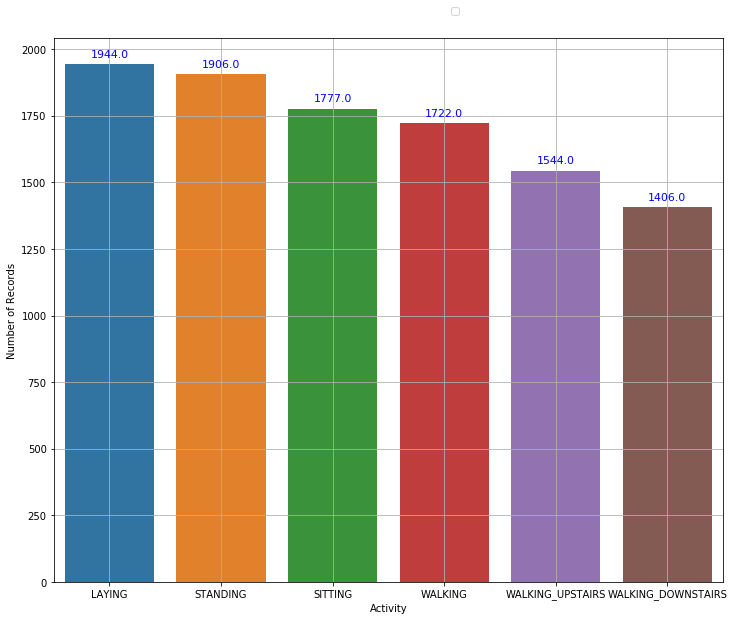

In [11]:
## plot Graph for record count for each Activity Label 
Activity_df = pd.value_counts(df_data['Activity'])
Activity_df= pd.DataFrame(Activity_df)
Activity_df = Activity_df.reset_index()
Activity_df.columns = ['Activity', 'Number of Record']   
    
ab = Activity_df
plt.figure(figsize=(12,10))
ax=plt.legend(bbox_to_anchor=(0.1, 1.0, 1., .102),loc=10, ncol=4,  #left, bottom, width, height
               )                 
ax.get_title().set_fontsize('20')
ax = sns.barplot(x='Activity', y='Number of Record', data=ab )
ax.set(xlabel = 'Activity', ylabel = 'Number of Records')
ax.grid(True)
for p in ax.patches:
     ax.annotate(f"{p.get_height() }", (p.get_x() + p.get_width() / 2., p.get_height()),
         ha='center', va='center', fontsize=11, color='blue', rotation=0, xytext=(0, 10),
         textcoords='offset points') 

In [12]:
## Check all the columns for df d Data set
df_data.columns

Index(['tBodyAcc-mean()-X', 'tBodyAcc-mean()-Y', 'tBodyAcc-mean()-Z',
       'tBodyAcc-std()-X', 'tBodyAcc-std()-Y', 'tBodyAcc-std()-Z',
       'tBodyAcc-mad()-X', 'tBodyAcc-mad()-Y', 'tBodyAcc-mad()-Z',
       'tBodyAcc-max()-X',
       ...
       'angle(tBodyAccMean,gravity)', 'angle(tBodyAccJerkMean),gravityMean)',
       'angle(tBodyGyroMean,gravityMean)',
       'angle(tBodyGyroJerkMean,gravityMean)', 'angle(X,gravityMean)',
       'angle(Y,gravityMean)', 'angle(Z,gravityMean)', 'subject', 'Activity',
       'Data'],
      dtype='object', length=564)

<Figure size 864x864 with 0 Axes>

No handles with labels found to put in legend.


[Text(0, 0.5, 'Number of Record'), Text(0.5, 0, 'Activity')]

Text(0, 10, '18.88%')

Text(0, 10, '18.51%')

Text(0, 10, '17.25%')

Text(0, 10, '16.72%')

Text(0, 10, '14.99%')

Text(0, 10, '13.65%')

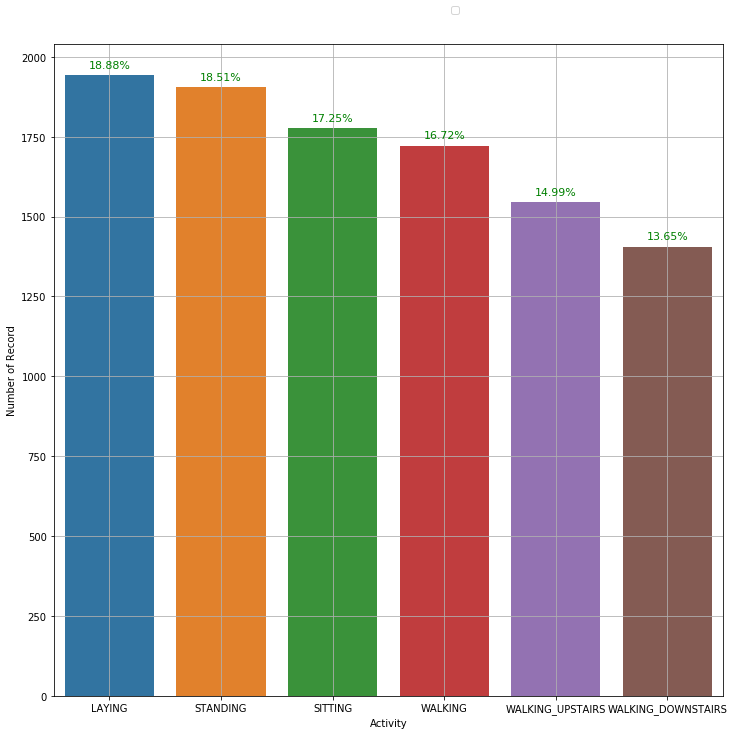

In [13]:
# Activity Type Distribution - Annotation with Percenatage
ab = Activity_df
plt.figure(figsize=(12,12))
ax=plt.legend(bbox_to_anchor=(0.1, 1.0, 1., .102),loc=10, ncol=4,  #left, bottom, width, height
                )                 
ax.get_title().set_fontsize('20')
ax = sns.barplot(x='Activity', y='Number of Record', data=ab )
ax.set(xlabel = 'Activity', ylabel = 'Number of Record')
ax.grid(True)
for p in ax.patches:
     ax.annotate(f"{p.get_height() * 100 / ab['Number of Record'].sum():.2f}%", 
                 (p.get_x() + p.get_width() / 2., p.get_height()),
         ha='center', va='center', fontsize=11, color='green', rotation=0, xytext=(0, 10),
         textcoords='offset points') 

#### 3. Exploratory data analysis

,Activity,Number of Record
0,LAYING,1944
1,STANDING,1906
2,SITTING,1777
3,WALKING,1722
4,WALKING_UPSTAIRS,1544
5,WALKING_DOWNSTAIRS,1406


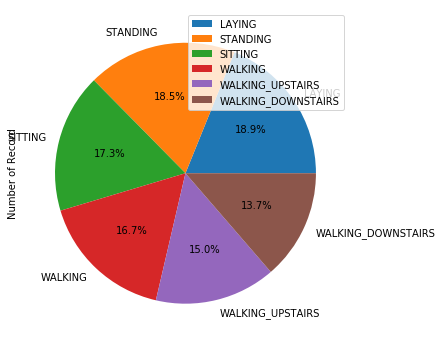

In [14]:
### Activity label data distribution

Activity_df
Activity_df.plot.pie(y='Number of Record', figsize=(8, 6),labels=Activity_df['Activity'],autopct='%1.1f%%')
plt.show()

- Label of activity, 
1. There are 1944 record for Activity  (Lying)
2. There are 1906 record for Activity  (Standing)
3. There are 1777 Record for Activity (Sitting)
4. There are 1722 record for Activity ( Walking)
5. There are 1544 record for Activity (Walking upstairs)
6. There are 1406 record for Activity(Walking Downstairs)

- Label of activity, 
1. There are 18.88% record for Activity  (Lying)
2. There are 18.51% record for Activity  (Standing)
3. There are 17.25% Record for Activity (Sitting)
4. There are 16.72% record for Activity ( Walking)
5. There are 14.99% record for Activity (Walking upstairs)
6. There are 13.65% record for Activity(Walking Downstairs)

Text(0.5, 0, 'Features')

Text(0, 0.5, 'Value')

Text(0.5, 1.0, 'Feature Distribution')

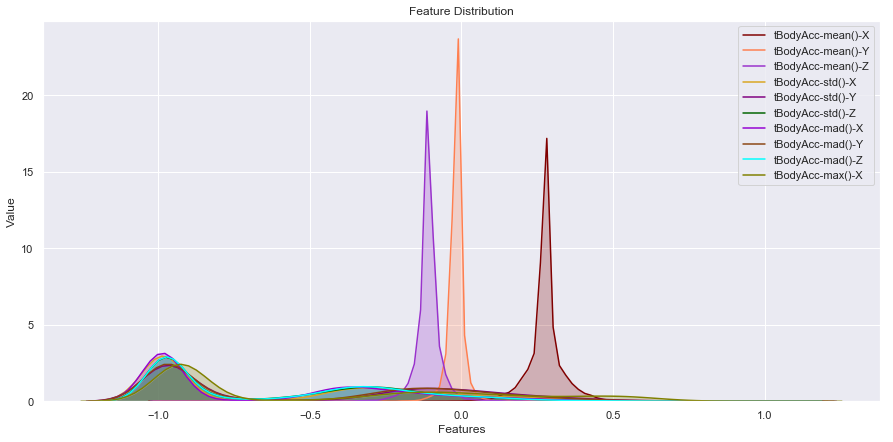

In [15]:
sns.set(rc={'figure.figsize':(15,7)})
colours = ["maroon","coral","darkorchid","goldenrod","purple","darkgreen","darkviolet","saddlebrown","aqua","olive"]
index = -1
for i in df_data.columns[0:10]:
    index = index + 1
    fig = sns.kdeplot(df_data[i] , shade=True, color=colours[index])
plt.xlabel("Features")
plt.ylabel("Value")
plt.title("Feature Distribution")
plt.grid(True)
plt.show(fig)

Text(0.5, 0, 'Features')

Text(0, 0.5, 'Value')

Text(0.5, 1.0, 'Feature Distribution')

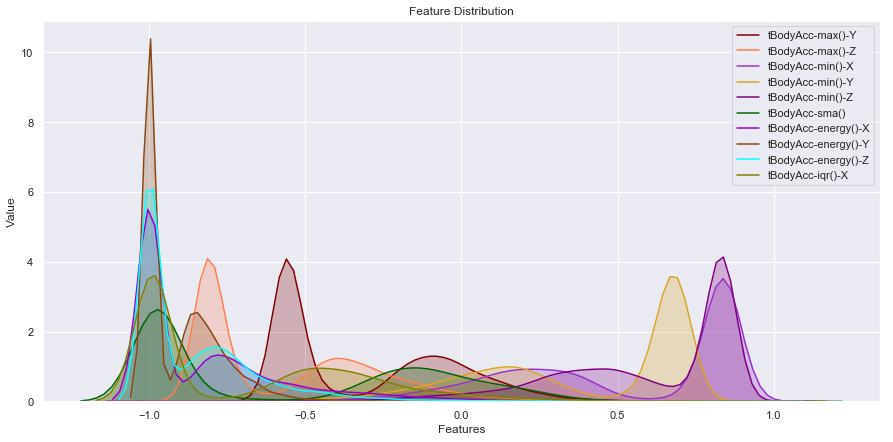

In [16]:

sns.set(rc={'figure.figsize':(15,7)})
colours = ["maroon","coral","darkorchid","goldenrod","purple","darkgreen","darkviolet","saddlebrown","aqua","olive"]
index = -1
for i in df_data.columns[10:20]:
    index = index + 1
    ax1 = sns.kdeplot(df_data[i] , shade=True, color=colours[index])
plt.xlabel("Features")
plt.ylabel("Value")
plt.title("Feature Distribution")
plt.grid(True)
plt.show(fig)

Text(0.5, 0, 'Features')

Text(0, 0.5, 'Value')

Text(0.5, 1.0, 'Feature Distribution')

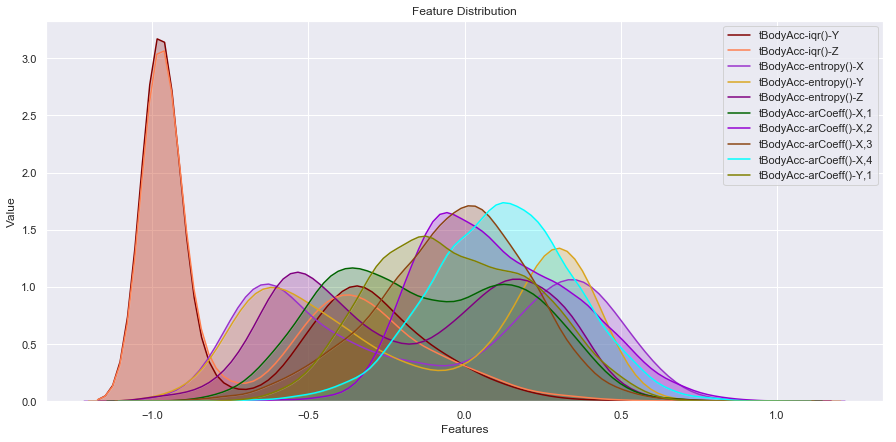

In [17]:
sns.set(rc={'figure.figsize':(15,7)})
colours = ["maroon","coral","darkorchid","goldenrod","purple","darkgreen","darkviolet","saddlebrown","aqua","olive"]
index = -1
for i in df_data.columns[20:30]:
    index = index + 1
    ax1 = sns.kdeplot(df_data[i] , shade=True, color=colours[index])
plt.xlabel("Features")
plt.ylabel("Value")
plt.title("Feature Distribution")
plt.grid(True)
plt.show(fig)

Text(0.5, 0, 'Features')

Text(0, 0.5, 'Value')

Text(0.5, 1.0, 'Feature Distribution')

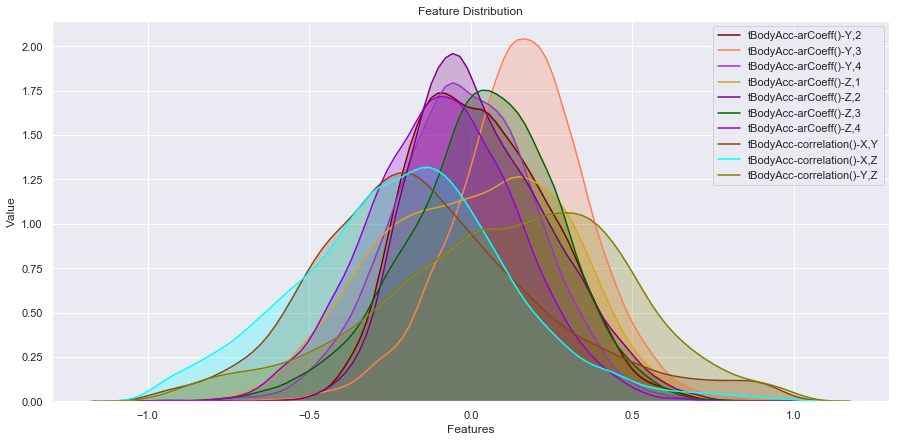

In [18]:

sns.set(rc={'figure.figsize':(15,7)})
colours = ["maroon","coral","darkorchid","goldenrod","purple","darkgreen","darkviolet","saddlebrown","aqua","olive"]
index = -1
for i in df_data.columns[30:40]:
    index = index + 1
    ax1 = sns.kdeplot(df_data[i] , shade=True, color=colours[index])
plt.xlabel("Features")
plt.ylabel("Value")
plt.title("Feature Distribution")
plt.grid(True)
plt.show(fig)

Text(0.5, 0, 'Features')

Text(0, 0.5, 'Value')

Text(0.5, 1.0, 'Feature Distribution')

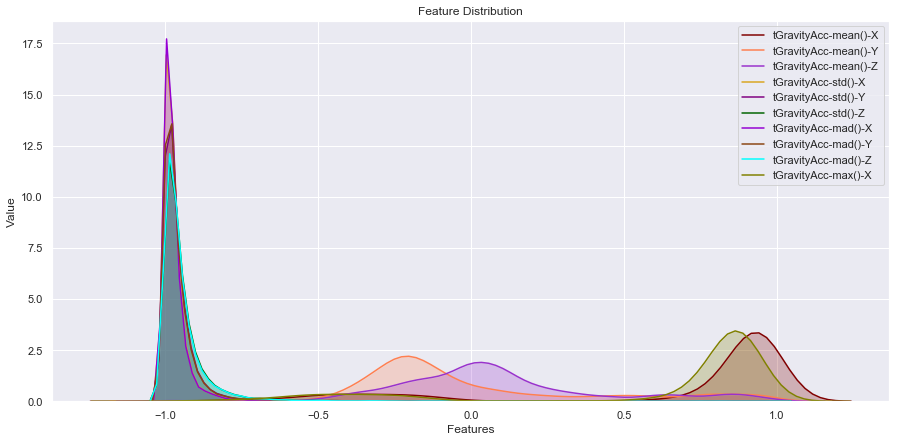

In [19]:
sns.set(rc={'figure.figsize':(15,7)})
colours = ["maroon","coral","darkorchid","goldenrod","purple","darkgreen","darkviolet","saddlebrown","aqua","olive"]
index = -1
for i in df_data.columns[40:50]:
    index = index + 1
    ax1 = sns.kdeplot(df_data[i] , shade=True, color=colours[index])
plt.xlabel("Features")
plt.ylabel("Value")
plt.title("Feature Distribution")
plt.grid(True)
plt.show(fig)

Text(0.5, 1.0, 'Feature Distribution')

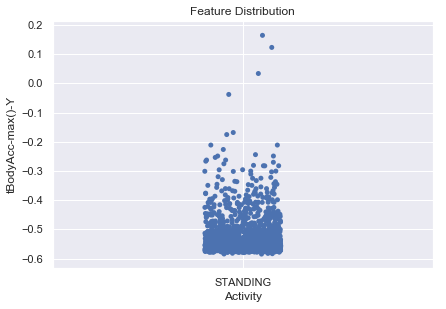

Text(0.5, 1.0, 'Feature Distribution')

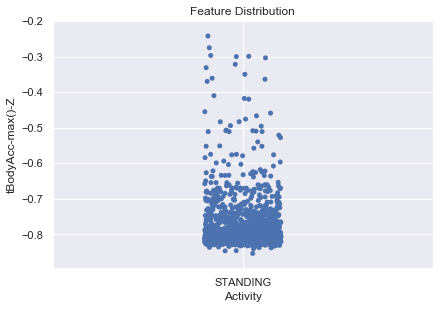

Text(0.5, 1.0, 'Feature Distribution')

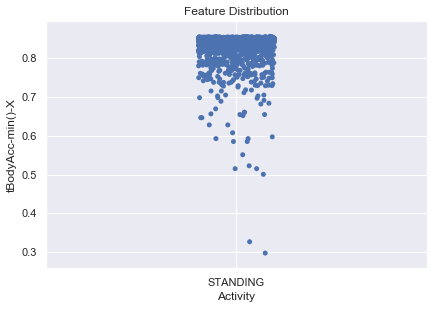

Text(0.5, 1.0, 'Feature Distribution')

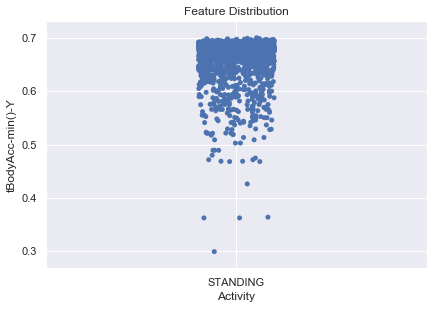

In [20]:
sns.set(rc={'figure.figsize':(15,10)})
plt.subplot(221)
fig1 = sns.stripplot(x='Activity', y= df_data.loc[df_data['Activity']=="STANDING"].iloc[:,10], data= df_data.loc[df_data['Activity']=="STANDING"], jitter=True)
plt.title("Feature Distribution")
plt.grid(True)
plt.show(fig1)
plt.subplot(224)
fig2 = sns.stripplot(x='Activity', y= df_data.loc[df_data['Activity']=="STANDING"].iloc[:,11], data= df_data.loc[df_data['Activity']=="STANDING"], jitter=True)
plt.title("Feature Distribution")
plt.grid(True)
plt.show(fig2)
plt.subplot(223)
fig2 = sns.stripplot(x='Activity', y= df_data.loc[df_data['Activity']=="STANDING"].iloc[:,12], data= df_data.loc[df_data['Activity']=="STANDING"], jitter=True)
plt.title("Feature Distribution")
plt.grid(True)
plt.show(fig2)
plt.subplot(222)
fig2 = sns.stripplot(x='Activity', y= df_data.loc[df_data['Activity']=="STANDING"].iloc[:,13], data= df_data.loc[df_data['Activity']=="STANDING"], jitter=True)
plt.title("Feature Distribution")
plt.grid(True)
plt.show(fig2)

<Figure size 720x504 with 0 Axes>

Text(0, 0.5, 'Angle between X-axis and gravityMean')

Text(0.5, 1.0, 'Box plot of angle(X,gravityMean) column across various activities')

(array([0, 1, 2, 3, 4, 5]), <a list of 6 Text xticklabel objects>)

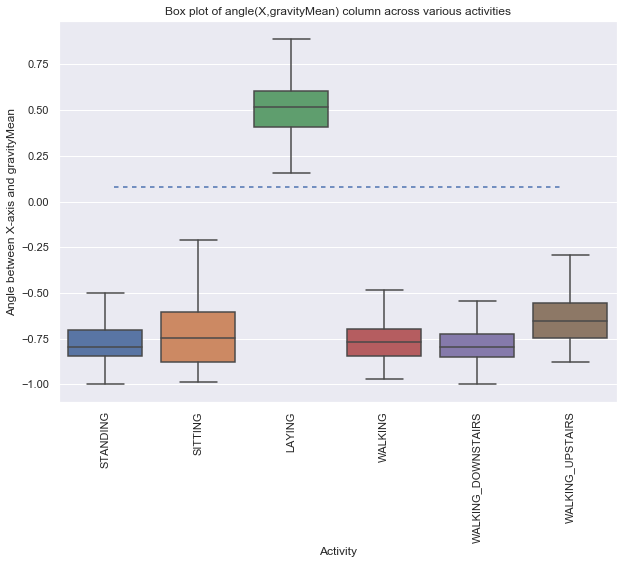

In [21]:
plt.figure(figsize=(10,7))
sns.boxplot(x='Activity', y='angle(X,gravityMean)', data=df_data, showfliers=False)
plt.axhline(y=0.08, xmin=0.1, xmax=0.9,dashes=(3,3))
plt.ylabel("Angle between X-axis and gravityMean")
plt.title('Box plot of angle(X,gravityMean) column across various activities')
plt.xticks(rotation = 90)

<Figure size 720x504 with 0 Axes>

Text(0, 0.5, 'Body Acceleration Magnitude mean')

Text(0.5, 1.0, 'Boxplot of tBodyAccMag-mean() column across various activities')

(array([0, 1, 2, 3, 4, 5]), <a list of 6 Text xticklabel objects>)

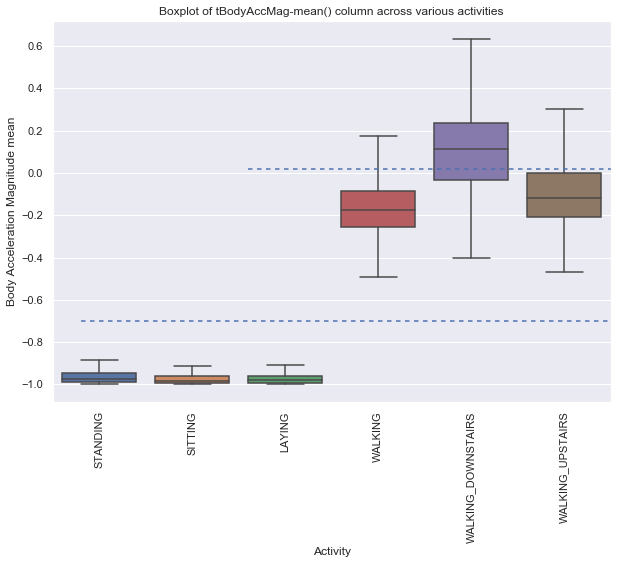

In [22]:
plt.figure(figsize=(10,7))
sns.boxplot(x='Activity', y='tBodyAccMag-mean()',data=df_data, showfliers=False)
plt.ylabel('Body Acceleration Magnitude mean')
plt.title("Boxplot of tBodyAccMag-mean() column across various activities")
plt.axhline(y=-0.7, xmin=0.05,dashes=(3,3))
plt.axhline(y=0.020, xmin=0.35, dashes=(3,3))
plt.xticks(rotation=90)

<Figure size 720x504 with 0 Axes>

Text(0, 0.5, 'Angle between Y-axis and gravityMean')

Text(0.5, 1.0, 'Box plot of angle(Y,gravityMean) column across various activities')

(array([0, 1, 2, 3, 4, 5]), <a list of 6 Text xticklabel objects>)

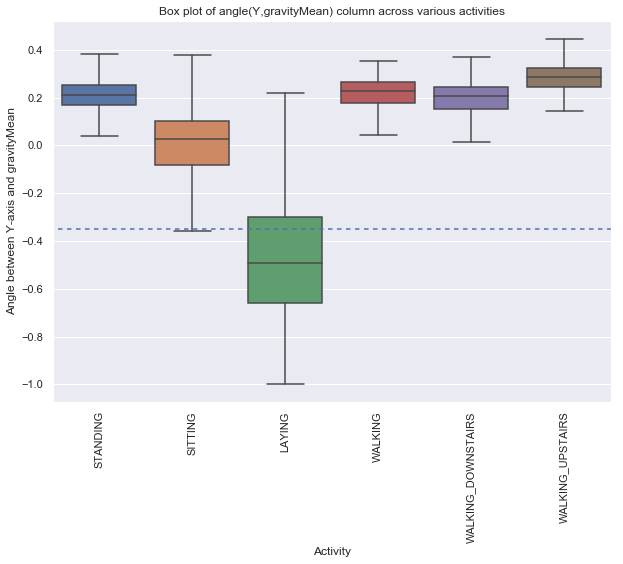

In [23]:
plt.figure(figsize=(10,7))
sns.boxplot(x='Activity', y='angle(Y,gravityMean)', data = df_data, showfliers=False)
plt.ylabel("Angle between Y-axis and gravityMean")
plt.title('Box plot of angle(Y,gravityMean) column across various activities')
plt.xticks(rotation = 90)
plt.axhline(y=-0.35, xmin=0.01, dashes=(3,3))

In [24]:
import seaborn as sns; 
plt.figure(figsize=(15,15))
k=df_data.corr()
#sns.heatmap(df_data.corr(),annot=True)

<Figure size 1080x1080 with 0 Axes>

<Figure size 1080x1080 with 0 Axes>

([<matplotlib.axis.YTick at 0x1995185fa58>,
 <a list of 16 Text yticklabel objects>)

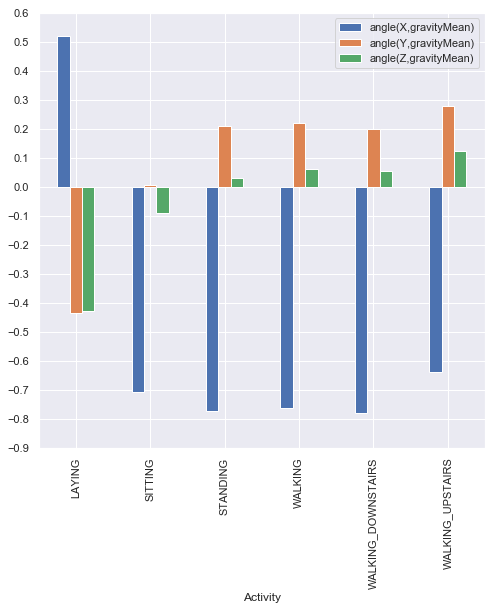

In [25]:
#bar-plot for mean angles in x,y,z directions in various activities

pd.pivot_table(df_data,values=['angle(X,gravityMean)','angle(Y,gravityMean)','angle(Z,gravityMean)'],index='Activity',aggfunc=np.mean).plot(kind='bar',figsize=(8,8))
plt.yticks(np.arange(-0.9,0.7,0.1))
plt.show()

<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'Participants Compared By Their Staircase Walking Duration')

Text(0.5, 0, 'Participants')

Text(0, 0.5, 'Total Duration [s]')

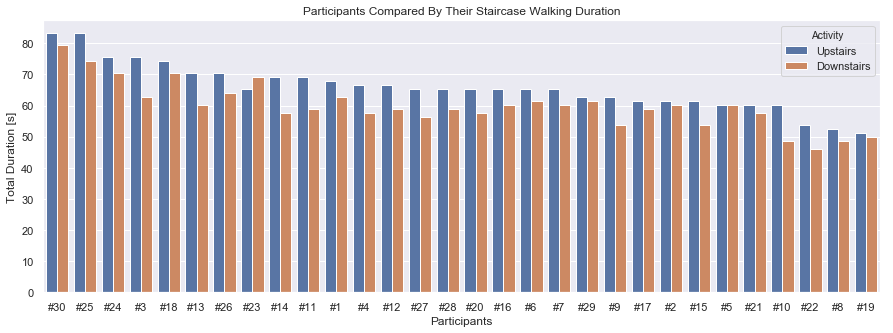

In [26]:
label =df_data['Activity']

mask = label.isin(['WALKING_UPSTAIRS', 'WALKING_DOWNSTAIRS'])
duration_df = (df_data[mask].groupby([label[mask], 'subject'])['Data'].count() * 1.28)

# Create plot
plot_data = duration_df.reset_index().sort_values('Data', ascending=False)
plot_data['Activity'] = plot_data['Activity'].map({'WALKING_UPSTAIRS':'Upstairs', 'WALKING_DOWNSTAIRS':'Downstairs'})

plt.figure(figsize=(15,5))
sns.barplot(data=plot_data, x='subject', y='Data', hue='Activity')
plt.title('Participants Compared By Their Staircase Walking Duration')
plt.xlabel('Participants')
plt.ylabel('Total Duration [s]')
plt.show()

<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'By What Percentage Is The Participant Faster In Walking Downstairs Than Upstairs?')

Text(0.5, 0, 'Participants')

Text(0, 0.5, 'Percent')

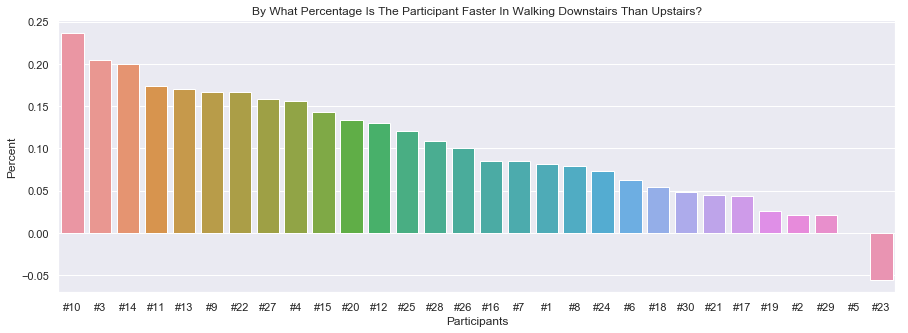

In [27]:
# Create data and plot
plt.figure(figsize=(15,5))
plot_data = ((duration_df.loc['WALKING_UPSTAIRS'] / duration_df.loc['WALKING_DOWNSTAIRS']) -1).sort_values(ascending=False)
sns.barplot(x=plot_data.index, y=plot_data)
plt.title('By What Percentage Is The Participant Faster In Walking Downstairs Than Upstairs?')
plt.xlabel('Participants')
plt.ylabel('Percent')
plt.show()

In [28]:
from sklearn.manifold import TSNE
X_train = train.iloc[:,0:(train.shape[1]-2)].values
tsne = TSNE()
X_reduced = tsne.fit_transform(X_train)
tsne_data = pd.DataFrame(
    {'X':X_reduced[:,0], 'Y':X_reduced[:,1], 
     'activity':train['Activity']})

activities = list(tsne_data['activity'].unique())
colormap = ['b', 'g', 'r', 'c', 'm', 'y']

fig, ax = plt.subplots(figsize=(12,12))
for i in range(len(activities)):
    plot_data = tsne_data.loc[tsne_data['activity'] == activities[i]]
    ax.scatter('X', 'Y', data=plot_data, color=colormap[i], label=activities[i])
ax.set_title('2-dimensional $t$-SNE embedding of 561-dimensional accelerometer data')
ax.legend()

plt.show()

KeyboardInterrupt: 

In [29]:
label_encoder = LabelEncoder()

df_data['Activity1'] = label_encoder.fit_transform(df_data.Activity)

In [30]:
df_data.columns.values

array(['tBodyAcc-mean()-X', 'tBodyAcc-mean()-Y', 'tBodyAcc-mean()-Z',
       'tBodyAcc-std()-X', 'tBodyAcc-std()-Y', 'tBodyAcc-std()-Z',
       'tBodyAcc-mad()-X', 'tBodyAcc-mad()-Y', 'tBodyAcc-mad()-Z',
       'tBodyAcc-max()-X', 'tBodyAcc-max()-Y', 'tBodyAcc-max()-Z',
       'tBodyAcc-min()-X', 'tBodyAcc-min()-Y', 'tBodyAcc-min()-Z',
       'tBodyAcc-sma()', 'tBodyAcc-energy()-X', 'tBodyAcc-energy()-Y',
       'tBodyAcc-energy()-Z', 'tBodyAcc-iqr()-X', 'tBodyAcc-iqr()-Y',
       'tBodyAcc-iqr()-Z', 'tBodyAcc-entropy()-X', 'tBodyAcc-entropy()-Y',
       'tBodyAcc-entropy()-Z', 'tBodyAcc-arCoeff()-X,1',
       'tBodyAcc-arCoeff()-X,2', 'tBodyAcc-arCoeff()-X,3',
       'tBodyAcc-arCoeff()-X,4', 'tBodyAcc-arCoeff()-Y,1',
       'tBodyAcc-arCoeff()-Y,2', 'tBodyAcc-arCoeff()-Y,3',
       'tBodyAcc-arCoeff()-Y,4', 'tBodyAcc-arCoeff()-Z,1',
       'tBodyAcc-arCoeff()-Z,2', 'tBodyAcc-arCoeff()-Z,3',
       'tBodyAcc-arCoeff()-Z,4', 'tBodyAcc-correlation()-X,Y',
       'tBodyAcc-correlation()-

In [ ]:

#Correlation with output variable
corr_1=df_data.corr()
cor_target = abs(corr_1["Activity1"])

In [ ]:
sns.heatmap(corr_1)

In [ ]:
plt.figure(figsize=(16,8))
plt.title('Data provided by each user', fontsize=20)
sns.countplot(x='subject',hue='Activity', data = df_data)
plt.show()

**3.  Data Prepation & PCA** 

In [106]:
### Covert Activity in Numeric value 


label_encoder = LabelEncoder()
for x in [train, test]:
    x['Activity1'] = label_encoder.fit_transform(x.Activity)

print(train['Activity1'].unique())
print(train['Activity'].unique())
print(test['Activity1'].unique())
print(test['Activity'].unique())

print(train['Activity1'])
print(train['Activity'])

[2 1 0 3 4 5]
['STANDING' 'SITTING' 'LAYING' 'WALKING' 'WALKING_DOWNSTAIRS'
 'WALKING_UPSTAIRS']
[2 1 0 3 4 5]
['STANDING' 'SITTING' 'LAYING' 'WALKING' 'WALKING_DOWNSTAIRS'
 'WALKING_UPSTAIRS']
0       2
1       2
2       2
3       2
4       2
5       2
6       2
7       2
8       2
9       2
10      2
11      2
12      2
13      2
14      2
15      2
16      2
17      2
18      2
19      2
20      2
21      2
22      2
23      2
24      2
25      2
26      2
27      1
28      1
29      1
30      1
31      1
32      1
33      1
34      1
35      1
36      1
37      1
38      1
39      1
40      1
41      1
42      1
43      1
44      1
45      1
46      1
47      1
48      1
49      1
50      1
51      0
52      0
53      0
54      0
55      0
56      0
57      0
58      0
59      0
60      0
61      0
62      0
63      0
64      0
65      0
66      0
67      0
68      0
69      0
70      0
71      0
72      0
73      0
74      0
75      0
76      0
77      0
78      3
79      3
80    

In [71]:
train[['Activity','Activity1']]

,Activity,Activity1
0,STANDING,2
1,STANDING,2
2,STANDING,2
3,STANDING,2
4,STANDING,2
5,STANDING,2
6,STANDING,2
7,STANDING,2
8,STANDING,2
9,STANDING,2


In [72]:
test[['Activity','Activity1']]

,Activity,Activity1
0,STANDING,2
1,STANDING,2
2,STANDING,2
3,STANDING,2
4,STANDING,2
5,STANDING,2
6,STANDING,2
7,STANDING,2
8,STANDING,2
9,STANDING,2


In [107]:
## Create X and Y train & test data :-

#Train Data:-

X_train=train.drop(['Activity','subject','Activity1','Data'],axis=1)
Y_train=train['Activity1']
print(X_train.shape)
print(Y_train.shape)

#Test Data:

X_test=test.drop(['Activity','subject','Activity1','Data'],axis=1)
Y_test=test['Activity1']
Y_test1=test['Activity']
print(X_test.shape)
print(Y_test.shape)






(7352, 561)
(7352,)
(2947, 561)
(2947,)


In [91]:
num_vars=X_test.columns
num_vars

Index(['tBodyAcc-mean()-X', 'tBodyAcc-mean()-Y', 'tBodyAcc-mean()-Z',
       'tBodyAcc-std()-X', 'tBodyAcc-std()-Y', 'tBodyAcc-std()-Z',
       'tBodyAcc-mad()-X', 'tBodyAcc-mad()-Y', 'tBodyAcc-mad()-Z',
       'tBodyAcc-max()-X',
       ...
       'fBodyBodyGyroJerkMag-meanFreq()', 'fBodyBodyGyroJerkMag-skewness()',
       'fBodyBodyGyroJerkMag-kurtosis()', 'angle(tBodyAccMean,gravity)',
       'angle(tBodyAccJerkMean),gravityMean)',
       'angle(tBodyGyroMean,gravityMean)',
       'angle(tBodyGyroJerkMean,gravityMean)', 'angle(X,gravityMean)',
       'angle(Y,gravityMean)', 'angle(Z,gravityMean)'],
      dtype='object', length=561)

In [92]:
X_train

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,tBodyAcc-max()-Y,tBodyAcc-max()-Z,tBodyAcc-min()-X,tBodyAcc-min()-Y,tBodyAcc-min()-Z,tBodyAcc-sma(),tBodyAcc-energy()-X,tBodyAcc-energy()-Y,tBodyAcc-energy()-Z,tBodyAcc-iqr()-X,tBodyAcc-iqr()-Y,tBodyAcc-iqr()-Z,tBodyAcc-entropy()-X,tBodyAcc-entropy()-Y,tBodyAcc-entropy()-Z,"tBodyAcc-arCoeff()-X,1","tBodyAcc-arCoeff()-X,2","tBodyAcc-arCoeff()-X,3","tBodyAcc-arCoeff()-X,4","tBodyAcc-arCoeff()-Y,1","tBodyAcc-arCoeff()-Y,2","tBodyAcc-arCoeff()-Y,3","tBodyAcc-arCoeff()-Y,4","tBodyAcc-arCoeff()-Z,1","tBodyAcc-arCoeff()-Z,2","tBodyAcc-arCoeff()-Z,3","tBodyAcc-arCoeff()-Z,4","tBodyAcc-correlation()-X,Y","tBodyAcc-correlation()-X,Z","tBodyAcc-correlation()-Y,Z",tGravityAcc-mean()-X,tGravityAcc-mean()-Y,tGravityAcc-mean()-Z,tGravityAcc-std()-X,tGravityAcc-std()-Y,tGravityAcc-std()-Z,tGravityAcc-mad()-X,tGravityAcc-mad()-Y,tGravityAcc-mad()-Z,tGravityAcc-max()-X,tGravityAcc-max()-Y,tGravityAcc-max()-Z,tGravityAcc-min()-X,tGravityAcc-min()-Y,tGravityAcc-min()-Z,tGravityAcc-sma(),tGravityAcc-energy()-X,tGravityAcc-energy()-Y,tGravityAcc-energy()-Z,tGravityAcc-iqr()-X,tGravityAcc-iqr()-Y,tGravityAcc-iqr()-Z,tGravityAcc-entropy()-X,tGravityAcc-entropy()-Y,tGravityAcc-entropy()-Z,"tGravityAcc-arCoeff()-X,1","tGravityAcc-arCoeff()-X,2","tGravityAcc-arCoeff()-X,3","tGravityAcc-arCoeff()-X,4","tGravityAcc-arCoeff()-Y,1","tGravityAcc-arCoeff()-Y,2","tGravityAcc-arCoeff()-Y,3","tGravityAcc-arCoeff()-Y,4","tGravityAcc-arCoeff()-Z,1","tGravityAcc-arCoeff()-Z,2","tGravityAcc-arCoeff()-Z,3","tGravityAcc-arCoeff()-Z,4","tGravityAcc-correlation()-X,Y","tGravityAcc-correlation()-X,Z","tGravityAcc-correlation()-Y,Z",tBodyAccJerk-mean()-X,tBodyAccJerk-mean()-Y,tBodyAccJerk-mean()-Z,tBodyAccJerk-std()-X,tBodyAccJerk-std()-Y,tBodyAccJerk-std()-Z,tBodyAccJerk-mad()-X,tBodyAccJerk-mad()-Y,tBodyAccJerk-mad()-Z,tBodyAccJerk-max()-X,tBodyAccJerk-max()-Y,tBodyAccJerk-max()-Z,tBodyAccJerk-min()-X,tBodyAccJerk-min()-Y,tBodyAccJerk-min()-Z,tBodyAccJerk-sma(),tBodyAccJerk-energy()-X,tBodyAccJerk-energy()-Y,tBodyAccJerk-energy()-Z,tBodyAccJerk-iqr()-X,tBodyAccJerk-iqr()-Y,tBodyAccJerk-iqr()-Z,tBodyAccJerk-entropy()-X,tBodyAccJerk-entropy()-Y,tBodyAccJerk-entropy()-Z,"tBodyAccJerk-arCoeff()-X,1","tBodyAccJerk-arCoeff()-X,2","tBodyAccJerk-arCoeff()-X,3","tBodyAccJerk-arCoeff()-X,4","tBodyAccJerk-arCoeff()-Y,1","tBodyAccJerk-arCoeff()-Y,2","tBodyAccJerk-arCoeff()-Y,3","tBodyAccJerk-arCoeff()-Y,4","tBodyAccJerk-arCoeff()-Z,1","tBodyAccJerk-arCoeff()-Z,2","tBodyAccJerk-arCoeff()-Z,3","tBodyAccJerk-arCoeff()-Z,4","tBodyAccJerk-correlation()-X,Y","tBodyAccJerk-correlation()-X,Z","tBodyAccJerk-correlation()-Y,Z",tBodyGyro-mean()-X,tBodyGyro-mean()-Y,tBodyGyro-mean()-Z,tBodyGyro-std()-X,tBodyGyro-std()-Y,tBodyGyro-std()-Z,tBodyGyro-mad()-X,tBodyGyro-mad()-Y,tBodyGyro-mad()-Z,tBodyGyro-max()-X,tBodyGyro-max()-Y,tBodyGyro-max()-Z,tBodyGyro-min()-X,tBodyGyro-min()-Y,tBodyGyro-min()-Z,tBodyGyro-sma(),tBodyGyro-energy()-X,tBodyGyro-energy()-Y,tBodyGyro-energy()-Z,tBodyGyro-iqr()-X,tBodyGyro-iqr()-Y,tBodyGyro-iqr()-Z,tBodyGyro-entropy()-X,tBodyGyro-entropy()-Y,tBodyGyro-entropy()-Z,"tBodyGyro-arCoeff()-X,1","tBodyGyro-arCoeff()-X,2","tBodyGyro-arCoeff()-X,3","tBodyGyro-arCoeff()-X,4","tBodyGyro-arCoeff()-Y,1",...,"fBodyAccJerk-bandsEnergy()-17,24.2","fBodyAccJerk-bandsEnergy()-25,32.2","fBodyAccJerk-bandsEnergy()-33,40.2","fBodyAccJerk-bandsEnergy()-41,48.2","fBodyAccJerk-bandsEnergy()-49,56.2","fBodyAccJerk-bandsEnergy()-57,64.2","fBodyAccJerk-bandsEnergy()-1,16.2","fBodyAccJerk-bandsEnergy()-17,32.2","fBodyAccJerk-bandsEnergy()-33,48.2","fBodyAccJerk-bandsEnergy()-49,64.2","fBodyAccJerk-bandsEnergy()-1,24.2","fBodyAccJerk-bandsEnergy()-25,48.2",fBodyGyro-mean()-X,fBodyGyro-mean()-Y,fBodyGyro-mean()-Z,fBodyGyro-std()-X,fBodyGyro-std()-Y,fBodyGyro-std()-Z,fBodyGyro-mad()-X,fBodyGyro-mad()-Y,fBodyGyro-mad()-Z,fBod

In [108]:
### Normalize the data 

from sklearn.preprocessing import MinMaxScaler
#scaler = MinMaxScaler()
#normalize=Normalizer()
from sklearn.preprocessing import StandardScaler


#test[num_vars] = normalize.fit_transform(test[num_vars])
#train[num_vars] = normalize.fit_transform(train[num_vars])

sc=StandardScaler()

X_train = sc.fit_transform(X_train)
X_test[num_vars]= sc.fit_transform(X_test)

In [39]:
#X_train[num_vars] = normalize.fit_transform(X_train[num_vars])
#X_test[num_vars]=normalize.fit_transform(X_test[num_vars])

##### PCA to apply feature reduction 


In [109]:
#Improting the PCA module
from sklearn.decomposition import PCA
#pca = PCA(svd_solver='randomized', random_state=42,n_components=100)

pca =PCA(0.95) #95% variance
X_train_PCA=pca.fit_transform(X_train) #for training data

In [110]:
print(pca.n_components_)

102


In [111]:
X_test_PCA = pca.transform(X_test)

In [114]:
X_test_PCA

array([[-1.09451194e+01, -1.86116925e+00,  2.22811041e+00, ...,
        -2.94299115e-01, -2.86387299e-01,  1.50373051e+00],
       [-1.41138879e+01, -1.07789259e+00, -3.96704326e-01, ...,
         5.20775835e-01, -2.18199588e-01,  2.76059624e-01],
       [-1.53242443e+01,  2.36521609e+00, -2.25329687e+00, ...,
        -1.45953657e+00, -5.45727584e-01, -1.04834143e-02],
       ...,
       [ 1.30452775e+01, -2.90806716e+00,  3.20774534e+00, ...,
        -1.43728965e+00, -8.44472580e-01,  6.37825085e-02],
       [ 9.08003829e+00, -3.97068504e+00,  1.92692084e+00, ...,
        -1.35085632e-01,  1.63390074e-01,  8.51451269e-01],
       [ 1.03615162e+01, -3.45369912e+00,  2.29164702e+00, ...,
         4.27397752e-01, -6.02739095e-01, -4.56024095e-01]])

In [95]:
#Doing the PCA on country data frame
pca.fit(X_train)


PCA(copy=True, iterated_power='auto', n_components=100, random_state=42,
  svd_solver='randomized', tol=0.0, whiten=False)

In [105]:
##check the PCA component
pca.components_

array([[ 2.80886217e-05, -2.47348433e-03, -1.52730914e-03, ...,
        -2.31004290e-02,  2.97187859e-02,  2.66216889e-02],
       [ 1.56380722e-02, -8.03820536e-05, -4.05212976e-03, ...,
         1.74761761e-02, -3.52131796e-02, -1.72777838e-02],
       [-3.24820577e-02,  2.69527509e-03,  1.01672220e-02, ...,
         1.07507871e-01, -8.00525165e-02, -6.44242263e-02],
       ...,
       [ 3.17340831e-02, -7.43429286e-03, -1.87392972e-02, ...,
         1.39546687e-02, -2.80934750e-02,  4.80943243e-02],
       [ 1.54328127e-02, -2.87057303e-02, -4.91130645e-02, ...,
         3.98385770e-02,  7.65121000e-02, -1.21757300e-02],
       [-1.47672578e-02,  7.49326256e-02,  4.40038934e-02, ...,
        -4.69103255e-02, -7.40295714e-02,  8.90673328e-03]])

Text(0.5, 0, 'number of components')

Text(0, 0.5, 'cumulative explained variance')

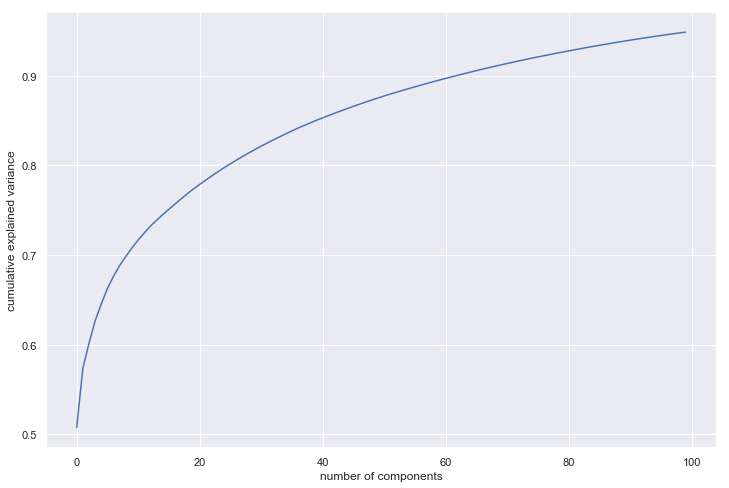

In [96]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

### As we are able to acheive 95% of variance with PCA components as 60 an dable to achieve approx 90% variance with 40 components 

In [43]:
# Using incremental PCA for efficiency - saves a lot of time on larger datasets
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=100)

In [44]:
### 
X_train_pca = pca_final.fit_transform(X_train)
X_train_pca.shape

(7352, 100)

In [45]:
#creating correlation matrix for the principal components
corrmat = np.corrcoef(X_train_pca.transpose())

<Figure size 1440x720 with 0 Axes>

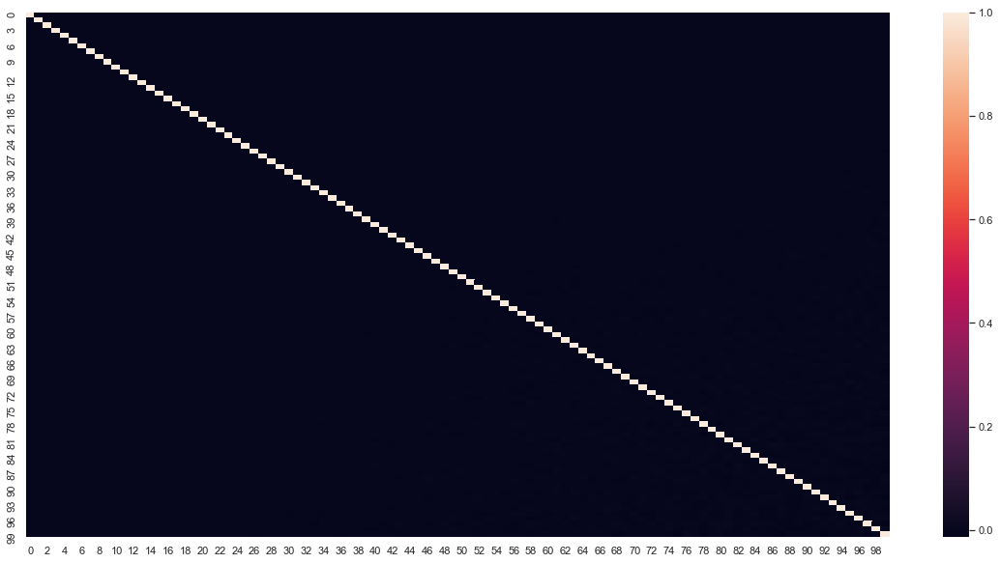

In [46]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (20,10))
sns.heatmap(corrmat)

#### We can see that correlations are indeed very close to 0 so multicollinearity is almost removed after PCA

In [47]:
# Maximum and Minimum valyes of correlation
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)


max corr: 0.008320616975743319 , min corr:  -0.01363397489462927


In [117]:
X_test_PCA

array([[-1.09451194e+01, -1.86116925e+00,  2.22811041e+00, ...,
        -2.94299115e-01, -2.86387299e-01,  1.50373051e+00],
       [-1.41138879e+01, -1.07789259e+00, -3.96704326e-01, ...,
         5.20775835e-01, -2.18199588e-01,  2.76059624e-01],
       [-1.53242443e+01,  2.36521609e+00, -2.25329687e+00, ...,
        -1.45953657e+00, -5.45727584e-01, -1.04834143e-02],
       ...,
       [ 1.30452775e+01, -2.90806716e+00,  3.20774534e+00, ...,
        -1.43728965e+00, -8.44472580e-01,  6.37825085e-02],
       [ 9.08003829e+00, -3.97068504e+00,  1.92692084e+00, ...,
        -1.35085632e-01,  1.63390074e-01,  8.51451269e-01],
       [ 1.03615162e+01, -3.45369912e+00,  2.29164702e+00, ...,
         4.27397752e-01, -6.02739095e-01, -4.56024095e-01]])

In [118]:
X_train_pca= pd.DataFrame(X_train_PCA)
train_PCA = pd.concat([X_train_pca,Y_train],axis=1,sort=False)

In [119]:
X_test_pca= pd.DataFrame(X_test_PCA)
test_PCA = pd.concat([X_test_pca,Y_test],axis=1,sort=False)

In [49]:
train_PCA

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,Activity1
0,-0.274661,-0.014221,0.044239,-0.043133,0.093612,0.006072,0.011894,-0.047683,0.024477,0.064477,-0.034119,0.038833,0.016353,-0.008571,0.003092,0.062004,-0.000156,-0.038387,-0.043269,0.041373,0.008692,0.027369,0.050982,0.028853,-0.014689,0.011508,-0.033401,0.032933,-0.026441,0.008551,-0.035987,0.012583,0.004507,-0.015972,0.038392,0.046078,0.040539,0.028336,0.026281,0.037018,-0.011348,0.003330,0.019406,0.005486,-0.026264,0.011655,0.033542,-0.008183,0.009781,0.013815,1.248128e-02,-0.004252,-0.021621,0.015006,-0.003950,-0.020456,0.028577,-0.013620,0.003256,0.025722,0.003476,0.019271,-0.006529,0.000688,0.038909,-0.009866,0.002480,0.005427,-0.001067,-0.019885,0.043633,-0.012862,0.000380,0.004127,-0.004338,-0.028773,-0.015501,0.017519,-0.001464,0.003374,1.708487e-02,0.007951,-0.006456,0.024258,0.016655,0.006181,-0.010551,0.015108,-0.044432,-0.005050,-0.006040,-0.019431,0.012384,0.011890,-0.004268,-0.001342,-0.004520,-0.012564,-0.011136,-0.003355,2
1,-0.277445,-0.013528,0.075286,-0.044493,0.059074,-0.012129,-0.028058,-0.070941,-0.040506,0.005515,0.019618,0.003617,0.000491,-0.000978,0.005999,0.014719,0.009376,-0.007275,0.011551,0.018965,0.025083,-0.019999,0.002164,-0.000957,-0.011164,0.000095,0.008830,0.006933,-0.023700,0.008168,-0.000471,0.019618,0.007465,-0.014915,-0.003361,-0.000389,0.008019,-0.021659,-0.015120,-0.008717,-0.009571,-0.003329,0.000612,-0.006933,-0.008132,0.004103,-0.012858,0.010978,-0.005416,0.002607,7.047303e-03,0.039159,-0.002286,0.004220,0.006152,0.010108,0.007082,0.000041,0.018919,-0.014621,-0.010717,0.016837,-0.007685,0.021927,0.020257,0.002386,-0.004992,0.020612,0.004928,0.006373,-0.004637,-0.012092,-0.013050,-0.002781,-0.015357,0.006871,-0.008909,-0.003557,-0.000273,0.006005,-3.259778e-03,0.002502,0.011487,-0.010980,0.020125,-0.000890,-0.011546,-0.001568,-0.009222,-0.006182,0.005377,0.005618,0.003333,-0.001077,-0.000520,0.000789,-0.001109,-0.011614,-0.004807,-0.003336,2
2,-0.270402,-0.034001,0.085766,-0.051079,0.048369,-0.008830,-0.000419,-0.006987,0.005641,0.006085,0.002896,-0.009276,0.000367,0.004434,-0.012815,0.010714,0.015703,-0.012407,0.003433,0.025953,0.032635,-0.007642,-0.026303,-0.011711,-0.017659,-0.002648,-0.012679,-0.010985,-0.012905,-0.014821,-0.000207,-0.011357,-0.011176,0.010292,0.006904,0.017379,0.009074,-0.006242,-0.015641,-0.015824,0.005188,-0.012230,0.019329,0.008219,0.005662,-0.011074,-0.018449,0.027653,-0.012682,-0.001952,1.445023e-02,0.015928,0.016743,-0.004326,-0.007706,0.015156,0.003118,0.013777,0.006313,-0.006293,0.011710,0.004641,0.002526,0.011145,-0.000523,0.005395,0.008207,0.011724,0.001704,0.001906,0.003188,0.004952,-0.002527,0.001770,0.003049,0.000971,0.010323,0.010285,-0.014410,-0.000749,2.308257e-03,0.008825,0.000129,0.007141,0.002843,-0.002267,-0.001740,0.000866,0.007861,-0.021158,0.003544,-0.011966,0.004696,0.006441,-0.004917,-0.025895,-0.011609,0.005115,0.012374,-0.009798,2
3,-0.281278,-0.065050,0.082948,-0.028730,0.048044,0.019769,-0.031502,0.002595,-0.056688,0.011325,0.035018,0.003088,-0.026101,0.011246,-0.005696,-0.005237,-0.009797,0.018474,-0.012880,0.002075,-0.018158,-0.001192,-0.001285,-0.016176,0.027074,-0.013273,0.007924,-0.008436,-0.014339,-0.011164,-0.020490,-0.012300,-0.002067,0.027756,0.015368,0.011213,0.002699,0.010127,0.004029,0.013315,0.007186,-0.007147,-0.013140,-0.013131,0.001862,-0.015752,-0.013561,0.012332,-0.008560,0.003872,-1.757643e-03,0.013961,0.003348,0.010028,0.008025,0.012444,0.014762,0.022530,0.004103,-0.003558,0.012718,0.006458,-0.013691,0.000772,-0.011497,0.001246,0.011456,0.017945,0.006431,-0.008430,0.000532,0.001957,-0.012831,0.006515,0.010813,0.003746,0.015315,0.017933,-0.012376,-0.005652,-3.601639e-03,-0.004951,-0.000948,0.000676,-0.011045,-0.002517,

In [50]:
train_PCA.head(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,Activity1
0,-0.274661,-0.014221,0.044239,-0.043133,0.093612,0.006072,0.011894,-0.047683,0.024477,0.064477,-0.034119,0.038833,0.016353,-0.008571,0.003092,0.062004,-0.000156,-0.038387,-0.043269,0.041373,0.008692,0.027369,0.050982,0.028853,-0.014689,0.011508,-0.033401,0.032933,-0.026441,0.008551,-0.035987,0.012583,0.004507,-0.015972,0.038392,0.046078,0.040539,0.028336,0.026281,0.037018,-0.011348,0.003330,0.019406,0.005486,-0.026264,0.011655,0.033542,-0.008183,0.009781,0.013815,0.012481,-0.004252,-0.021621,0.015006,-0.003950,-0.020456,0.028577,-0.013620,0.003256,0.025722,0.003476,0.019271,-0.006529,0.000688,0.038909,-0.009866,0.002480,0.005427,-0.001067,-0.019885,0.043633,-0.012862,0.000380,0.004127,-0.004338,-0.028773,-0.015501,0.017519,-0.001464,0.003374,0.017085,0.007951,-0.006456,0.024258,0.016655,0.006181,-0.010551,0.015108,-0.044432,-0.005050,-0.006040,-0.019431,0.012384,0.011890,-0.004268,-0.001342,-0.004520,-0.012564,-0.011136,-0.003355,2
1,-0.277445,-0.013528,0.075286,-0.044493,0.059074,-0.012129,-0.028058,-0.070941,-0.040506,0.005515,0.019618,0.003617,0.000491,-0.000978,0.005999,0.014719,0.009376,-0.007275,0.011551,0.018965,0.025083,-0.019999,0.002164,-0.000957,-0.011164,0.000095,0.008830,0.006933,-0.023700,0.008168,-0.000471,0.019618,0.007465,-0.014915,-0.003361,-0.000389,0.008019,-0.021659,-0.015120,-0.008717,-0.009571,-0.003329,0.000612,-0.006933,-0.008132,0.004103,-0.012858,0.010978,-0.005416,0.002607,0.007047,0.039159,-0.002286,0.004220,0.006152,0.010108,0.007082,0.000041,0.018919,-0.014621,-0.010717,0.016837,-0.007685,0.021927,0.020257,0.002386,-0.004992,0.020612,0.004928,0.006373,-0.004637,-0.012092,-0.013050,-0.002781,-0.015357,0.006871,-0.008909,-0.003557,-0.000273,0.006005,-0.003260,0.002502,0.011487,-0.010980,0.020125,-0.000890,-0.011546,-0.001568,-0.009222,-0.006182,0.005377,0.005618,0.003333,-0.001077,-0.000520,0.000789,-0.001109,-0.011614,-0.004807,-0.003336,2
2,-0.270402,-0.034001,0.085766,-0.051079,0.048369,-0.008830,-0.000419,-0.006987,0.005641,0.006085,0.002896,-0.009276,0.000367,0.004434,-0.012815,0.010714,0.015703,-0.012407,0.003433,0.025953,0.032635,-0.007642,-0.026303,-0.011711,-0.017659,-0.002648,-0.012679,-0.010985,-0.012905,-0.014821,-0.000207,-0.011357,-0.011176,0.010292,0.006904,0.017379,0.009074,-0.006242,-0.015641,-0.015824,0.005188,-0.012230,0.019329,0.008219,0.005662,-0.011074,-0.018449,0.027653,-0.012682,-0.001952,0.014450,0.015928,0.016743,-0.004326,-0.007706,0.015156,0.003118,0.013777,0.006313,-0.006293,0.011710,0.004641,0.002526,0.011145,-0.000523,0.005395,0.008207,0.011724,0.001704,0.001906,0.003188,0.004952,-0.002527,0.001770,0.003049,0.000971,0.010323,0.010285,-0.014410,-0.000749,0.002308,0.008825,0.000129,0.007141,0.002843,-0.002267,-0.001740,0.000866,0.007861,-0.021158,0.003544,-0.011966,0.004696,0.006441,-0.004917,-0.025895,-0.011609,0.005115,0.012374,-0.009798,2
3,-0.281278,-0.065050,0.082948,-0.028730,0.048044,0.019769,-0.031502,0.002595,-0.056688,0.011325,0.035018,0.003088,-0.026101,0.011246,-0.005696,-0.005237,-0.009797,0.018474,-0.012880,0.002075,-0.018158,-0.001192,-0.001285,-0.016176,0.027074,-0.013273,0.007924,-0.008436,-0.014339,-0.011164,-0.020490,-0.012300,-0.002067,0.027756,0.015368,0.011213,0.002699,0.010127,0.004029,0.013315,0.007186,-0.007147,-0.013140,-0.013131,0.001862,-0.015752,-0.013561,0.012332,-0.008560,0.003872,-0.001758,0.013961,0.003348,0.010028,0.008025,0.012444,0.014762,0.022530,0.004103,-0.003558,0.012718,0.006458,-0.013691,0.000772,-0.011497,0.001246,0.011456,0.017945,0.006431,-0.008430,0.000532,0.001957,-0.012831,0.006515,0.010813,0.003746,0.015315,0.017933,-0.012376,-0.005652,-0.003602,-0.004951,-0.000948,0.000676,-0.011045,-0.002517,0.007862,0.013068,0.016538,-0.00

In [51]:
train.head()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,tBodyAcc-max()-Y,tBodyAcc-max()-Z,tBodyAcc-min()-X,tBodyAcc-min()-Y,tBodyAcc-min()-Z,tBodyAcc-sma(),tBodyAcc-energy()-X,tBodyAcc-energy()-Y,tBodyAcc-energy()-Z,tBodyAcc-iqr()-X,tBodyAcc-iqr()-Y,tBodyAcc-iqr()-Z,tBodyAcc-entropy()-X,tBodyAcc-entropy()-Y,tBodyAcc-entropy()-Z,"tBodyAcc-arCoeff()-X,1","tBodyAcc-arCoeff()-X,2","tBodyAcc-arCoeff()-X,3","tBodyAcc-arCoeff()-X,4","tBodyAcc-arCoeff()-Y,1","tBodyAcc-arCoeff()-Y,2","tBodyAcc-arCoeff()-Y,3","tBodyAcc-arCoeff()-Y,4","tBodyAcc-arCoeff()-Z,1","tBodyAcc-arCoeff()-Z,2","tBodyAcc-arCoeff()-Z,3","tBodyAcc-arCoeff()-Z,4","tBodyAcc-correlation()-X,Y","tBodyAcc-correlation()-X,Z","tBodyAcc-correlation()-Y,Z",tGravityAcc-mean()-X,tGravityAcc-mean()-Y,tGravityAcc-mean()-Z,tGravityAcc-std()-X,tGravityAcc-std()-Y,tGravityAcc-std()-Z,tGravityAcc-mad()-X,tGravityAcc-mad()-Y,tGravityAcc-mad()-Z,tGravityAcc-max()-X,tGravityAcc-max()-Y,tGravityAcc-max()-Z,tGravityAcc-min()-X,tGravityAcc-min()-Y,tGravityAcc-min()-Z,tGravityAcc-sma(),tGravityAcc-energy()-X,tGravityAcc-energy()-Y,tGravityAcc-energy()-Z,tGravityAcc-iqr()-X,tGravityAcc-iqr()-Y,tGravityAcc-iqr()-Z,tGravityAcc-entropy()-X,tGravityAcc-entropy()-Y,tGravityAcc-entropy()-Z,"tGravityAcc-arCoeff()-X,1","tGravityAcc-arCoeff()-X,2","tGravityAcc-arCoeff()-X,3","tGravityAcc-arCoeff()-X,4","tGravityAcc-arCoeff()-Y,1","tGravityAcc-arCoeff()-Y,2","tGravityAcc-arCoeff()-Y,3","tGravityAcc-arCoeff()-Y,4","tGravityAcc-arCoeff()-Z,1","tGravityAcc-arCoeff()-Z,2","tGravityAcc-arCoeff()-Z,3","tGravityAcc-arCoeff()-Z,4","tGravityAcc-correlation()-X,Y","tGravityAcc-correlation()-X,Z","tGravityAcc-correlation()-Y,Z",tBodyAccJerk-mean()-X,tBodyAccJerk-mean()-Y,tBodyAccJerk-mean()-Z,tBodyAccJerk-std()-X,tBodyAccJerk-std()-Y,tBodyAccJerk-std()-Z,tBodyAccJerk-mad()-X,tBodyAccJerk-mad()-Y,tBodyAccJerk-mad()-Z,tBodyAccJerk-max()-X,tBodyAccJerk-max()-Y,tBodyAccJerk-max()-Z,tBodyAccJerk-min()-X,tBodyAccJerk-min()-Y,tBodyAccJerk-min()-Z,tBodyAccJerk-sma(),tBodyAccJerk-energy()-X,tBodyAccJerk-energy()-Y,tBodyAccJerk-energy()-Z,tBodyAccJerk-iqr()-X,tBodyAccJerk-iqr()-Y,tBodyAccJerk-iqr()-Z,tBodyAccJerk-entropy()-X,tBodyAccJerk-entropy()-Y,tBodyAccJerk-entropy()-Z,"tBodyAccJerk-arCoeff()-X,1","tBodyAccJerk-arCoeff()-X,2","tBodyAccJerk-arCoeff()-X,3","tBodyAccJerk-arCoeff()-X,4","tBodyAccJerk-arCoeff()-Y,1","tBodyAccJerk-arCoeff()-Y,2","tBodyAccJerk-arCoeff()-Y,3","tBodyAccJerk-arCoeff()-Y,4","tBodyAccJerk-arCoeff()-Z,1","tBodyAccJerk-arCoeff()-Z,2","tBodyAccJerk-arCoeff()-Z,3","tBodyAccJerk-arCoeff()-Z,4","tBodyAccJerk-correlation()-X,Y","tBodyAccJerk-correlation()-X,Z","tBodyAccJerk-correlation()-Y,Z",tBodyGyro-mean()-X,tBodyGyro-mean()-Y,tBodyGyro-mean()-Z,tBodyGyro-std()-X,tBodyGyro-std()-Y,tBodyGyro-std()-Z,tBodyGyro-mad()-X,tBodyGyro-mad()-Y,tBodyGyro-mad()-Z,tBodyGyro-max()-X,tBodyGyro-max()-Y,tBodyGyro-max()-Z,tBodyGyro-min()-X,tBodyGyro-min()-Y,tBodyGyro-min()-Z,tBodyGyro-sma(),tBodyGyro-energy()-X,tBodyGyro-energy()-Y,tBodyGyro-energy()-Z,tBodyGyro-iqr()-X,tBodyGyro-iqr()-Y,tBodyGyro-iqr()-Z,tBodyGyro-entropy()-X,tBodyGyro-entropy()-Y,tBodyGyro-entropy()-Z,"tBodyGyro-arCoeff()-X,1","tBodyGyro-arCoeff()-X,2","tBodyGyro-arCoeff()-X,3","tBodyGyro-arCoeff()-X,4","tBodyGyro-arCoeff()-Y,1",...,"fBodyAccJerk-bandsEnergy()-49,56.2","fBodyAccJerk-bandsEnergy()-57,64.2","fBodyAccJerk-bandsEnergy()-1,16.2","fBodyAccJerk-bandsEnergy()-17,32.2","fBodyAccJerk-bandsEnergy()-33,48.2","fBodyAccJerk-bandsEnergy()-49,64.2","fBodyAccJerk-bandsEnergy()-1,24.2","fBodyAccJerk-bandsEnergy()-25,48.2",fBodyGyro-mean()-X,fBodyGyro-mean()-Y,fBodyGyro-mean()-Z,fBodyGyro-std()-X,fBodyGyro-std()-Y,fBodyGyro-std()-Z,fBodyGyro-mad()-X,fBodyGyro-mad()-Y,fBodyGyro-mad()-Z,fBodyGyro-max()-X,fBodyGyro-max()-Y,fBodyGyro-max()-Z,fBodyGyro-min()-X,fBodyGyro-min()-Y,fBodyGyro-min()-Z,fBodyGyro-sma(),fBodyGyro-energy()-X,fBodyGy

In [52]:
## Rename PC Column name 
train_PCA.rename(columns={0: 'PC1', 1: 'PC2',2 :'PC3', 3:'PC4',4:'PC5',5:'PC6',6:'PC7',7:'PC8',8:'PC9',9:'PC10',10:'PC11',11:'PC12',12:'PC13',13:'PC14',14:'PC15',15:'PC16',16:'PC17',17:'PC18',18:'PC19',19:'PC20'},inplace=True)
train_PCA.head(5)


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,Activity1
0,-0.274661,-0.014221,0.044239,-0.043133,0.093612,0.006072,0.011894,-0.047683,0.024477,0.064477,-0.034119,0.038833,0.016353,-0.008571,0.003092,0.062004,-0.000156,-0.038387,-0.043269,0.041373,0.008692,0.027369,0.050982,0.028853,-0.014689,0.011508,-0.033401,0.032933,-0.026441,0.008551,-0.035987,0.012583,0.004507,-0.015972,0.038392,0.046078,0.040539,0.028336,0.026281,0.037018,-0.011348,0.003330,0.019406,0.005486,-0.026264,0.011655,0.033542,-0.008183,0.009781,0.013815,0.012481,-0.004252,-0.021621,0.015006,-0.003950,-0.020456,0.028577,-0.013620,0.003256,0.025722,0.003476,0.019271,-0.006529,0.000688,0.038909,-0.009866,0.002480,0.005427,-0.001067,-0.019885,0.043633,-0.012862,0.000380,0.004127,-0.004338,-0.028773,-0.015501,0.017519,-0.001464,0.003374,0.017085,0.007951,-0.006456,0.024258,0.016655,0.006181,-0.010551,0.015108,-0.044432,-0.005050,-0.006040,-0.019431,0.012384,0.011890,-0.004268,-0.001342,-0.004520,-0.012564,-0.011136,-0.003355,2
1,-0.277445,-0.013528,0.075286,-0.044493,0.059074,-0.012129,-0.028058,-0.070941,-0.040506,0.005515,0.019618,0.003617,0.000491,-0.000978,0.005999,0.014719,0.009376,-0.007275,0.011551,0.018965,0.025083,-0.019999,0.002164,-0.000957,-0.011164,0.000095,0.008830,0.006933,-0.023700,0.008168,-0.000471,0.019618,0.007465,-0.014915,-0.003361,-0.000389,0.008019,-0.021659,-0.015120,-0.008717,-0.009571,-0.003329,0.000612,-0.006933,-0.008132,0.004103,-0.012858,0.010978,-0.005416,0.002607,0.007047,0.039159,-0.002286,0.004220,0.006152,0.010108,0.007082,0.000041,0.018919,-0.014621,-0.010717,0.016837,-0.007685,0.021927,0.020257,0.002386,-0.004992,0.020612,0.004928,0.006373,-0.004637,-0.012092,-0.013050,-0.002781,-0.015357,0.006871,-0.008909,-0.003557,-0.000273,0.006005,-0.003260,0.002502,0.011487,-0.010980,0.020125,-0.000890,-0.011546,-0.001568,-0.009222,-0.006182,0.005377,0.005618,0.003333,-0.001077,-0.000520,0.000789,-0.001109,-0.011614,-0.004807,-0.003336,2
2,-0.270402,-0.034001,0.085766,-0.051079,0.048369,-0.008830,-0.000419,-0.006987,0.005641,0.006085,0.002896,-0.009276,0.000367,0.004434,-0.012815,0.010714,0.015703,-0.012407,0.003433,0.025953,0.032635,-0.007642,-0.026303,-0.011711,-0.017659,-0.002648,-0.012679,-0.010985,-0.012905,-0.014821,-0.000207,-0.011357,-0.011176,0.010292,0.006904,0.017379,0.009074,-0.006242,-0.015641,-0.015824,0.005188,-0.012230,0.019329,0.008219,0.005662,-0.011074,-0.018449,0.027653,-0.012682,-0.001952,0.014450,0.015928,0.016743,-0.004326,-0.007706,0.015156,0.003118,0.013777,0.006313,-0.006293,0.011710,0.004641,0.002526,0.011145,-0.000523,0.005395,0.008207,0.011724,0.001704,0.001906,0.003188,0.004952,-0.002527,0.001770,0.003049,0.000971,0.010323,0.010285,-0.014410,-0.000749,0.002308,0.008825,0.000129,0.007141,0.002843,-0.002267,-0.001740,0.000866,0.007861,-0.021158,0.003544,-0.011966,0.004696,0.006441,-0.004917,-0.025895,-0.011609,0.005115,0.012374,-0.009798,2
3,-0.281278,-0.065050,0.082948,-0.028730,0.048044,0.019769,-0.031502,0.002595,-0.056688,0.011325,0.035018,0.003088,-0.026101,0.011246,-0.005696,-0.005237,-0.009797,0.018474,-0.012880,0.002075,-0.018158,-0.001192,-0.001285,-0.016176,0.027074,-0.013273,0.007924,-0.008436,-0.014339,-0.011164,-0.020490,-0.012300,-0.002067,0.027756,0.015368,0.011213,0.002699,0.010127,0.004029,0.013315,0.007186,-0.007147,-0.013140,-0.013131,0.001862,-0.015752,-0.013561,0.012332,-0.008560,0.003872,-0.001758,0.013961,0.003348,0.010028,0.008025,0.012444,0.014762,0.022530,0.004103,-0.003558,0.012718,0.006458,-0.013691,0.000772,-0.011497,0.001246,0.011456,0.017945,0.006431,-0.008430,0.000532,0.001957,-0.012831,0.006515,0.010813,0.003746,0.015315,0.017933,-0.012376,-0.005652,-0.003602,-0.004951,-0.000948,0.000676,-0.011045,-

In [53]:
#check Data frame
train_PCA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7352 entries, 0 to 7351
Columns: 101 entries, PC1 to Activity1
dtypes: float64(100), int32(1)
memory usage: 5.6 MB


<Figure size 864x576 with 0 Axes>

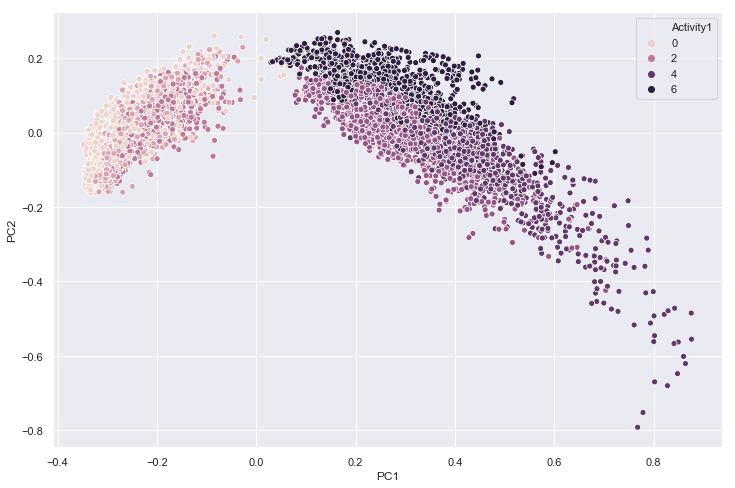

In [54]:
import seaborn as sns
plt.figure(figsize=(12,8))
sns.scatterplot(x='PC1',y='PC2',data=train_PCA,hue=Y_train)

In [55]:
Y_test.head()

0    2
1    2
2    2
3    2
4    2
Name: Activity1, dtype: int32

In [56]:
### 
X_test_pca = pca_final.fit_transform(X_test)
X_test_pca.shape
Y_test.shape

(2947, 100)

(2947,)

In [57]:
X_test_pca= pd.DataFrame(X_test_pca)
test_PCA = pd.concat([X_test_pca,Y_test],axis=1,sort=False)

In [58]:
## Rename PC Column name 
test_PCA.rename(columns={0: 'PC1', 1: 'PC2',2 :'PC3', 3:'PC4',4:'PC5',5:'PC6',6:'PC7',7:'PC8',8:'PC9',9:'PC10',10:'PC11',11:'PC12',12:'PC13',13:'PC14',14:'PC15',15:'PC16',16:'PC17',17:'PC18',18:'PC19',19:'PC20'},inplace=True)
test_PCA.head(5)


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,Activity1
0,-0.146905,0.055345,0.026868,-0.007266,-0.018597,-0.008621,-0.042042,-0.047260,-0.027110,-0.093095,-0.026766,0.035208,0.012093,-0.013106,-0.027498,0.015332,-0.072486,0.094844,-0.014525,0.050805,-0.008419,0.024125,-0.018525,0.049904,-0.006316,0.017660,-0.000586,0.019112,0.016668,-0.033203,0.037324,-0.003042,-0.011588,-0.003799,-0.015279,0.006625,-0.004071,-0.022132,0.012246,0.009517,-0.000088,0.007521,-0.021696,-0.024609,0.015017,-0.002181,0.017941,0.014509,0.013602,0.010561,-0.015670,-0.018443,-0.023357,-0.016906,-0.005360,0.016385,0.003448,0.012857,0.002413,0.001608,-0.008860,-0.015675,0.007505,0.032161,0.006753,-0.026057,0.008098,0.017602,-0.001642,0.004042,0.001181,-0.002332,0.017418,0.012463,-0.000105,0.013016,-0.003832,0.018948,-0.018939,-0.017983,0.011229,-0.001611,-0.008888,0.009546,-0.001534,0.003123,0.002337,-0.021475,-0.006485,-0.003028,-0.006699,0.009662,-0.012340,0.011259,-0.015301,-0.010968,-0.007139,-0.003396,-0.005776,-0.014556,2
1,-0.216039,0.028628,0.053514,0.018515,0.006291,-0.019365,-0.004380,-0.023039,-0.015899,-0.075100,-0.020319,0.076500,-0.043026,-0.019075,-0.004525,-0.005997,-0.003033,0.050727,0.025599,0.024889,-0.041745,-0.000707,-0.019520,0.025037,-0.001472,0.027475,-0.019383,0.000169,-0.042356,-0.005901,0.000740,0.004037,-0.005444,-0.017238,-0.013868,-0.023508,-0.019756,0.012118,0.019760,-0.017397,-0.011723,-0.005705,-0.029211,-0.026970,-0.020326,0.027129,0.007237,-0.003949,0.007202,-0.008426,-0.018442,0.020193,-0.000406,0.010978,0.023837,0.033674,0.017841,0.013629,0.029924,-0.016255,0.025429,0.023860,0.013936,-0.002971,0.000506,-0.006401,-0.010485,0.029334,-0.007291,0.017894,0.008069,-0.028005,0.002355,0.003859,-0.008821,0.001382,0.016770,-0.003202,0.023444,-0.003015,0.002554,0.001659,0.018000,-0.005731,0.005225,0.005025,0.001203,-0.002887,-0.005585,-0.004109,-0.014076,-0.003497,0.000093,0.010355,-0.001668,0.002655,0.003090,0.005055,0.002918,0.004827,2
2,-0.246917,-0.011364,0.076488,0.008950,0.033514,0.005622,0.010693,-0.015313,0.007383,0.002130,0.006144,-0.006476,-0.016745,0.030437,0.006133,-0.029322,-0.026870,0.039718,0.003176,0.035130,0.002679,0.014031,-0.010488,-0.041303,-0.016403,-0.026837,0.002466,0.022377,-0.020351,0.037516,-0.020341,0.004050,-0.006939,-0.007269,-0.016632,-0.020465,0.019187,0.028734,-0.010353,0.015417,-0.009993,0.007714,-0.026656,0.016287,0.003120,-0.004203,0.000249,-0.015589,0.025261,-0.001086,0.004465,-0.014119,0.019226,0.026831,0.003675,0.002907,-0.002942,0.019426,0.008200,0.005000,0.007584,0.011341,0.021918,-0.003562,-0.018063,0.003379,-0.002732,-0.003105,-0.008302,0.005428,0.009939,-0.003324,0.007521,-0.015640,-0.010445,0.013300,0.009065,0.033868,0.007915,0.008459,0.007914,-0.000045,0.013588,0.002768,0.000635,-0.009766,0.000169,0.002289,0.002771,-0.001848,-0.011027,0.002640,0.003550,0.009800,0.001140,-0.010136,-0.007257,-0.002503,0.017675,0.012320,2
3,-0.255580,0.002930,0.083927,0.029021,0.046447,0.019819,0.012511,-0.001078,0.055480,0.002806,0.023701,0.011671,-0.014584,0.021431,0.018240,-0.037794,0.004549,0.019277,0.017966,0.035144,0.000262,-0.005210,-0.017979,-0.035892,-0.007091,-0.012351,-0.018705,0.026293,-0.014577,0.048281,-0.015121,0.023429,-0.024444,0.012484,-0.004762,-0.018479,0.008374,0.042036,-0.000635,0.008579,-0.010627,0.015116,-0.028605,0.022005,-0.006964,0.000440,0.001607,-0.010908,0.035897,-0.010334,-0.005409,0.008483,0.020555,0.026491,-0.002860,-0.003132,0.002655,0.012108,-0.002705,0.014581,0.004484,0.000247,-0.006342,0.001485,-0.003850,0.012277,-0.010122,-0.002508,-0.000278,0.001105,0.005096,0.001269,-0.000724,-0.007619,-0.003610,-0.005083,0.004596,0.018997,0.005752,-0.000039,0.011790,0.017930,0.012332,-0.010152,0.0064

In [59]:
test_PCA

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,Activity1
0,-0.146905,0.055345,0.026868,-0.007266,-0.018597,-0.008621,-0.042042,-0.047260,-0.027110,-0.093095,-0.026766,0.035208,0.012093,-0.013106,-0.027498,0.015332,-0.072486,0.094844,-0.014525,0.050805,-0.008419,0.024125,-0.018525,0.049904,-0.006316,0.017660,-0.000586,0.019112,0.016668,-0.033203,0.037324,-0.003042,-0.011588,-0.003799,-0.015279,0.006625,-0.004071,-0.022132,0.012246,0.009517,-0.000088,7.520690e-03,-0.021696,-0.024609,0.015017,-0.002181,0.017941,0.014509,0.013602,0.010561,-0.015670,-0.018443,-0.023357,-0.016906,-0.005360,0.016385,0.003448,0.012857,0.002413,0.001608,-0.008860,-0.015675,0.007505,0.032161,0.006753,-0.026057,0.008098,0.017602,-0.001642,0.004042,0.001181,-0.002332,0.017418,0.012463,-0.000105,0.013016,-0.003832,0.018948,-0.018939,-0.017983,0.011229,-0.001611,-0.008888,0.009546,-0.001534,0.003123,0.002337,-0.021475,-0.006485,-0.003028,-0.006699,0.009662,-0.012340,0.011259,-0.015301,-0.010968,-0.007139,-0.003396,-0.005776,-0.014556,2
1,-0.216039,0.028628,0.053514,0.018515,0.006291,-0.019365,-0.004380,-0.023039,-0.015899,-0.075100,-0.020319,0.076500,-0.043026,-0.019075,-0.004525,-0.005997,-0.003033,0.050727,0.025599,0.024889,-0.041745,-0.000707,-0.019520,0.025037,-0.001472,0.027475,-0.019383,0.000169,-0.042356,-0.005901,0.000740,0.004037,-0.005444,-0.017238,-0.013868,-0.023508,-0.019756,0.012118,0.019760,-0.017397,-0.011723,-5.704770e-03,-0.029211,-0.026970,-0.020326,0.027129,0.007237,-0.003949,0.007202,-0.008426,-0.018442,0.020193,-0.000406,0.010978,0.023837,0.033674,0.017841,0.013629,0.029924,-0.016255,0.025429,0.023860,0.013936,-0.002971,0.000506,-0.006401,-0.010485,0.029334,-0.007291,0.017894,0.008069,-0.028005,0.002355,0.003859,-0.008821,0.001382,0.016770,-0.003202,0.023444,-0.003015,0.002554,0.001659,0.018000,-0.005731,0.005225,0.005025,0.001203,-0.002887,-0.005585,-0.004109,-0.014076,-0.003497,0.000093,0.010355,-0.001668,0.002655,0.003090,0.005055,0.002918,0.004827,2
2,-0.246917,-0.011364,0.076488,0.008950,0.033514,0.005622,0.010693,-0.015313,0.007383,0.002130,0.006144,-0.006476,-0.016745,0.030437,0.006133,-0.029322,-0.026870,0.039718,0.003176,0.035130,0.002679,0.014031,-0.010488,-0.041303,-0.016403,-0.026837,0.002466,0.022377,-0.020351,0.037516,-0.020341,0.004050,-0.006939,-0.007269,-0.016632,-0.020465,0.019187,0.028734,-0.010353,0.015417,-0.009993,7.713622e-03,-0.026656,0.016287,0.003120,-0.004203,0.000249,-0.015589,0.025261,-0.001086,0.004465,-0.014119,0.019226,0.026831,0.003675,0.002907,-0.002942,0.019426,0.008200,0.005000,0.007584,0.011341,0.021918,-0.003562,-0.018063,0.003379,-0.002732,-0.003105,-0.008302,0.005428,0.009939,-0.003324,0.007521,-0.015640,-0.010445,0.013300,0.009065,0.033868,0.007915,0.008459,0.007914,-0.000045,0.013588,0.002768,0.000635,-0.009766,0.000169,0.002289,0.002771,-0.001848,-0.011027,0.002640,0.003550,0.009800,0.001140,-0.010136,-0.007257,-0.002503,0.017675,0.012320,2
3,-0.255580,0.002930,0.083927,0.029021,0.046447,0.019819,0.012511,-0.001078,0.055480,0.002806,0.023701,0.011671,-0.014584,0.021431,0.018240,-0.037794,0.004549,0.019277,0.017966,0.035144,0.000262,-0.005210,-0.017979,-0.035892,-0.007091,-0.012351,-0.018705,0.026293,-0.014577,0.048281,-0.015121,0.023429,-0.024444,0.012484,-0.004762,-0.018479,0.008374,0.042036,-0.000635,0.008579,-0.010627,1.511588e-02,-0.028605,0.022005,-0.006964,0.000440,0.001607,-0.010908,0.035897,-0.010334,-0.005409,0.008483,0.020555,0.026491,-0.002860,-0.003132,0.002655,0.012108,-0.002705,0.014581,0.004484,0.000247,-0.006342,0.001485,-0.003850,0.012277,-0.010122,-0.002508,-0.000278,0.001105,0.005096,0.001269,-0.000724,-0.007619,-0.003610,-0.005083,0.004596,0.018997,0.005752,-0.000039,0.011790,0.017930,0.012332,

In [ ]:
#### Divide the data between X_train and Y_train

X_train=train_PCA.drop(['Activity1'],axis=1)
Y_train =train['Activity1']
print(X_train.shape)
print(Y_train.shape)

##test

X_test=test_PCA.drop(['Activity1'],axis=1)
Y_test =test['Activity1']

print(X_test.shape)
print(Y_test.shape)

Y_train.unique()

Y_test.unique()

In [ ]:
import seaborn as sns
plt.figure(figsize=(12,8))
sns.scatterplot(x='PC1',y='PC2',data=test_PCA,hue=Y_test)

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline


import plotly.express as px

fig=px.scatter_3d(train_PCA,x="PC1",y="PC2",z="PC3",color="Activity1",color_discrete_map={"PC1": "PC2","PC3":"green"})
fig.show()

In [120]:
train_PCA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7352 entries, 0 to 7351
Columns: 103 entries, 0 to Activity1
dtypes: float64(102), int32(1)
memory usage: 5.7 MB


In [121]:
test_PCA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2947 entries, 0 to 2946
Columns: 103 entries, 0 to Activity1
dtypes: float64(102), int32(1)
memory usage: 2.3 MB


In [122]:
train_PCA.to_csv("train_PCA.csv",index=False)
test_PCA.to_csv("test_PCA.csv",index=False)
